# Optimizing In-Store Product Placement for Grocery Retail
#### *By: Alya Al-Naimi, Oliver Cabasan, Mario Godinez, Maggie Hu and Rani Lottey*



## Abstract
This project aims to demonstrate association of consumer products in a retail grocery store which may help retailers organize product categories according to the consumption goal they serve (i.e. complement-based assortment organization) and to ultimately to increase purchases. By using an Apriori algorithm under unsupervised learning, association rules between grocery items is identified. The model is used to contruct a data driven retail solution by creating an online application in Dash to show grocery item sets that if placed together would potentially increase sales.

## 1. Introduction
The Consumer Packaged Goods (CPG) market is growing at a fast pace with substantial growth rates over the last few years and is estimated that the market will grow significantly in the coming years (Market Research Intellect, 2020). Technological advances, innovations as well as changes in the household consumption basket of goods have been driving the market in both online and brick-and-mortar retailers. 

When it comes to brick-and-mortar retail, product placement plays an important role in sales. The store environment influences buyers even more than many of us realize and research has shown that consumers make two-thirds of their decisions in the store (id8 Agency, 2018). Product placement depends on many factors that can range from the size of the store, seasonality, and consumer behavior. Two key product placement approaches commonly used are: 1) substitute or categorial groupings and 2) complement groupings.  Substitute or categorial groupings share attributes or physical characteristics while complement groupings place product based on a particular consumption goal or context of use. This placement method also has been referred to as goal-derived, consumption constellation–based, or shopping mission–based. However, as a brand looking for complementary product placement, truly analyzing how the placement of a product within a store is performing is a crucial step in any sales strategy. A complement based product strategy allows the consumer to easily visualize other products that they will potentially need or desire and acts as a visual cue for purchasing. 

### 1.1 Background
Brick-and-mortar stores use planograms (diagrams that specify where a certain product is located on store shelves and within the store) to strategically place products to increase consumer purchases. Some brands choose to position their products directly across from their complementary products. The best example for this would be chips and sodas, placing salty chips parallel from thirst-quenching cold sodas. A consumer adds a bag of salty chips to their cart, turns around and adds in a soda, knowing they’ll need a beverage to wash down their snack. Brands such as PepsiCo benefit from this method, using complementary product placement such as potato chips to increase their sales of sodas. Understanding buying patterns can help to increase sales in several ways:
 - Placing complementary products placed on the same shelf.
 - Promotional discounts for one of the complmentary products,
 - Marketing/ad campaigns for product A could be targeted at buyers who purchase complementary product B,
 - Products A and B could be combined into a new product.

The most common complementary product placement pairings are those that make the most sense for the consumer. Pairings are made to help ease a consumer’s journey throughout their shopping experience. By placing complementary goods close together, consumers don’t have to travel around the store to locate what they’re looking for which generates more product awareness and interest in those products. It makes the consumer buying experience more enjoyable, and at the same time, it increases sales. Initial studies of complementary product placement have suggested that although more effort is required initially the results are also more beneficial compared to substitute product placement.

Using a data driven approach a model can be developed using point-of-purchase (POP) information which will recommend complementary product placement that can be used to build sales strategies, understand drivers that spark sales of a product and find out if a product is the driver for another item.

### 1.2 Business Objective and Dataset
#### *Business Problem Statement*
The main objective of this study is to investigate brick-and-mortar retail point-of-purchases and recommend complementary product groupings to optimize store sales. The user interface will be an application built using Dash by Python which will allow the user to obtain recommendations on complementary product groupings using an interactive graphic.

#### *Dataset*
This study uses a publicly available Kaggle dataset with purchase data made at various grocery store(s) (location unknown) and can be found at https://www.kaggle.com/heeraldedhia/groceries-dataset. The data was collected over January 5, 2014 to December 29, 2015. This results in approximately two years of data and the total amount of receipts being collected equals 88,163.

Each record in the data set contains the following information:
 - Member_number (unique ID of customer),
 - Date (date of purchase)
 - itemDescription (description of product purchased). 

It should be noted that the data is limited in that it only contains two years’ worth of data and no additional information on the grocery store(s) is provided.

#### *Assumptions*
It is assumed that these same buying patterns are still vaild and that the majority of products offered in the dataset are still available today. Due to the dataset size being smaller it is assumed that the buying patterns are representative and that there is no unintentional bias.

### 1.3 Aletheia Framework TM
The Alethia Framework evidence checklist has been attached with further detailed comments. Some of the key takeaways from this checklist were:

*Social Impact*:
The implementation of the AI model will be used to add tangible value to the retail company by i.e. increasing sales, improving supply chain and vendor management, etc. New jobs/roles will need to be added to support the AI model such as sales analysts, data analyst and dev ops roles to list a few. This AI model is intended to be used as a tool in conjunction with marketing, sales and business input to make overall decisions.

*Accuracy/Trust*:
The validity/accuracy processes will need to be implemented. Input from business units (finance/supply chain/sales/marketing) will be required to understand the insights that are brought to the retail company with this AI model. In addition, more data will need to be added to the dataset so that there is not any unintentional bias with continued use.

*Governance*:
Since there is no collection or use of personal data the security risks are low. However, assigned user authorizations, passwords, log history, code maintenance, etc should be implemented with an assigned manager from the IT department. 


## 2. Dataset Understanding

### 2.1 Initial Dataset Import and Configuration
The required libraries are imported for use and the Pandas version is checked to verify that the lastest version is being used.

In [137]:
%matplotlib inline
# import naming conventions 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import datetime as dt
from tabulate import tabulate

pd.set_option('display.max_columns', 75)

# Let's set some optional settings to allow for full column output:
pd.set_option("display.max_columns", None)

In [138]:
# Check Pandas version
pd.__version__

'1.1.3'

A user defined function called *resumetable* is created which will simplify the analysis of the dataframes as it consolidates various commands for the initial data exploration.

In [139]:
# This will be used to check the datset shape, null values and number of unique values.
def resumetable(df):
    print(f"Dataset Shape: {df.shape}")
    summary = pd.DataFrame(df.dtypes,columns=['dtypes'])
    summary = summary.reset_index()
    summary['Name'] = summary['index']
    summary = summary[['Name','dtypes']]
    summary['Missing'] = df.isnull().sum().values    
    summary['Uniques'] = df.nunique().values
    return summary

#### *Import Datasets*
Loading the dataset into Python and running *resumetable* to get information on the dataset. As shown below the dataset has three columns and 38,765 records. There are not any null values and duplicate values are expected for different combinations of customer IDs, dates and item descriptions. The column headings are also changed for improved description of the columns.

In [140]:
groce_df = pd.read_csv('Groceries_dataset.csv',sep = ',')
groce_df

,Member_number,Date,itemDescription
0,1808,21-07-2015,tropical fruit
1,2552,05-01-2015,whole milk
2,2300,19-09-2015,pip fruit
3,1187,12-12-2015,other vegetables
4,3037,01-02-2015,whole milk
...,...,...,...
38760,4471,08-10-2014,sliced cheese
38761,2022,23-02-2014,candy
38762,1097,16-04-2014,cake bar
38763,1510,03-12-2014,fruit/vegetable juice


In [141]:
resumetable(groce_df)

Dataset Shape: (38765, 3)


,Name,dtypes,Missing,Uniques
0,Member_number,int64,0,3898
1,Date,object,0,728
2,itemDescription,object,0,167


##### Data Types and Column Names
To facilitate the analysis the data types of the Member_number and Date are changed. In addition, the column names are renamed for ease of reference going forward.

In [142]:
groce_df['Member_number']=groce_df['Member_number'].astype(str)

In [143]:
groce_df['Date'] =  pd.to_datetime(groce_df['Date'], format='%d-%m-%Y')
groce_df.dtypes

Member_number              object
Date               datetime64[ns]
itemDescription            object
dtype: object

In [144]:
groce_df = groce_df.rename(columns={'Member_number' : 'Customer_ID'})
groce_df = groce_df.rename(columns={'Date' : 'Date_of_Sale'})
groce_df = groce_df.rename(columns={'itemDescription' : 'Item_Desc'})
groce_df.head()

,Customer_ID,Date_of_Sale,Item_Desc
0,1808,2015-07-21,tropical fruit
1,2552,2015-01-05,whole milk
2,2300,2015-09-19,pip fruit
3,1187,2015-12-12,other vegetables
4,3037,2015-02-01,whole milk


### 2.2 Dataset Exploration
#### *Top 25 Items Sold*
As a part of the initial data exploration the top 25 items most sold are plotted. Based on Figure 1 shown below, it is seen that *whole milk* is by far the most popular item with 2502 more buys than the second most popular item *other vegatables*. These top 25 most popular items are ones that should be stocked by a food retailer for improved sales.

In [145]:
from tabulate import tabulate

In [146]:
# groce_df.sort_values(by='Item_Desc', ascending='False').groupby(['Item_Desc']).size()
groce_25 = groce_df.groupby('Item_Desc')['Customer_ID'].count().nlargest(25)
print(groce_25.to_markdown())

| Item_Desc             |   Customer_ID |
|:----------------------|--------------:|
| whole milk            |          2502 |
| other vegetables      |          1898 |
| rolls/buns            |          1716 |
| soda                  |          1514 |
| yogurt                |          1334 |
| root vegetables       |          1071 |
| tropical fruit        |          1032 |
| bottled water         |           933 |
| sausage               |           924 |
| citrus fruit          |           812 |
| pastry                |           785 |
| pip fruit             |           744 |
| shopping bags         |           731 |
| canned beer           |           717 |
| bottled beer          |           687 |
| whipped/sour cream    |           662 |
| newspapers            |           596 |
| frankfurter           |           580 |
| brown bread           |           571 |
| domestic eggs         |           566 |
| pork                  |           566 |
| butter                |         

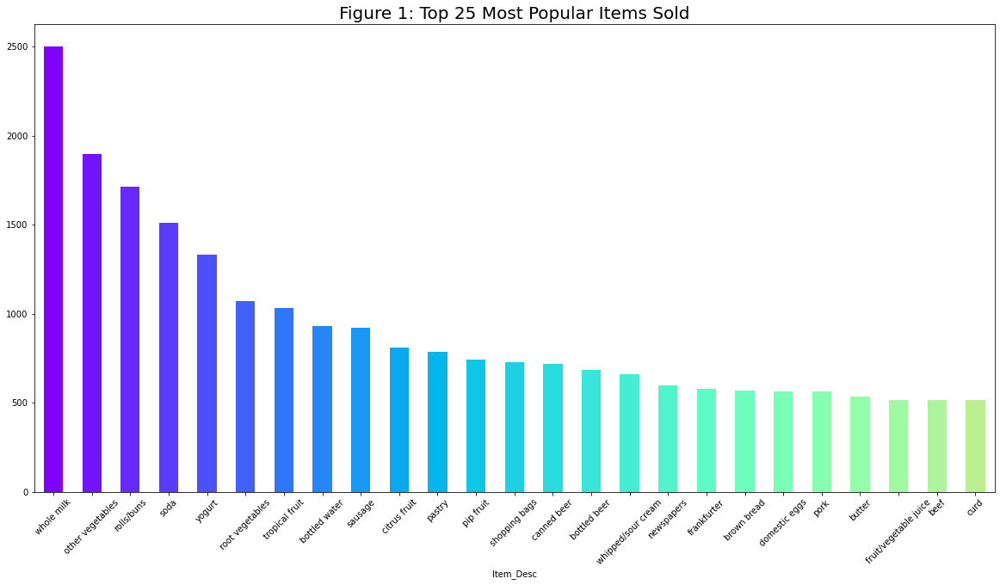

In [147]:
color = plt.cm.rainbow(np.linspace(0, 1, 40))
groce_25.plot.bar(color = color, figsize=(20,10))
plt.title('Figure 1: Top 25 Most Popular Items Sold', fontsize = 20)
plt.xticks(rotation = 45)
plt.show()

#### *Creating a Dataframe for Time Series Analysis*

It would be useful to explore the dataset over time as such the following libraries are imported to support this analysis.

In [148]:
%matplotlib inline
# import naming conventions 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sb
import datetime as dt

#plt.style.use('fivethirtyeight')

import seaborn as sns
from sklearn.model_selection import train_test_split
import math

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder

# Let's set some optional settings to allow for full column output:
pd.set_option("display.max_columns", None)
pd.options.display.max_rows = 100

*Total_Sales*

The dataframe *groce_25* is a Pandas series, it would be useful to convert this into a Pandas dataframe and rename the count to *Total_Sales* to understand the total sales.

In [149]:
# groce_25 is a pandas series, if we want to convert it into a pandas dataframe and rename the count to Total_Sales:
groce_df_25 = pd.DataFrame({'Item_Desc':groce_25.index, 'Total_Sales':groce_25.values})
groce_df_25.columns

Index(['Item_Desc', 'Total_Sales'], dtype='object')

#### *Items Sold Per Transaction*
The tables below show the items and number of items sold per transaction. On average each transaction had 2 items sold with the range of items sold per transaction to be 1-10 items. Also to note is that there are 3,898 unique customers.

In [150]:
# Count the number of Customers
print("Number of unique customers=")
len(groce_df["Customer_ID"].unique())

Number of unique customers=


3898

In [151]:
transc_df = groce_df.copy()
transc_df = transc_df.groupby(['Customer_ID','Date_of_Sale'])['Item_Desc'].unique()
transc_df= pd.DataFrame(transc_df)
transc_df.head(10)

Item_Desc
Customer_ID Date_of_Sale                                                   
1000        2014-06-24                    [whole milk, pastry, salty snack]
            2015-03-15    [sausage, whole milk, semi-finished bread, yog...
            2015-05-27                           [soda, pickled vegetables]
            2015-07-24                       [canned beer, misc. beverages]
            2015-11-25                          [sausage, hygiene articles]
1001        2014-02-07                    [sausage, whole milk, rolls/buns]
            2014-12-12                                   [whole milk, soda]
            2015-01-20              [frankfurter, soda, whipped/sour cream]
            2015-04-14                                  [beef, white bread]
            2015-05-02                                  [frankfurter, curd]

In [152]:
transc_df.reset_index
transc_df['no_of_item'] = transc_df['Item_Desc'].apply(lambda x: len(x))
transc_df.head(5)

Item_Desc  \
Customer_ID Date_of_Sale                                                      
1000        2014-06-24                    [whole milk, pastry, salty snack]   
            2015-03-15    [sausage, whole milk, semi-finished bread, yog...   
            2015-05-27                           [soda, pickled vegetables]   
            2015-07-24                       [canned beer, misc. beverages]   
            2015-11-25                          [sausage, hygiene articles]   

                          no_of_item  
Customer_ID Date_of_Sale              
1000        2014-06-24             3  
            2015-03-15             4  
            2015-05-27             2  
            2015-07-24             2  
            2015-11-25             2

In [153]:
transc_df['no_of_item'].describe()

count    14963.000000
mean         2.539999
std          1.060993
min          1.000000
25%          2.000000
50%          2.000000
75%          3.000000
max         10.000000
Name: no_of_item, dtype: float64

#### *Total Yearly Sales - Items*

A new table for *Item_Desc* and *Date_of_Sale* is created to facilitate the time series analysis. A table to show the total list of items sold over each year 2014 and 2015 is created below. Figures 2 and 3 show that the top three items sold are the same however in 2015 sausages were more popular than soda as the fourth most popular item. Further items can be compared as required.

In [154]:
# Creating a new table for Item_Desc and Date_of_Sale
item_date_df = groce_df[['Date_of_Sale', 'Item_Desc']] 

# Grouping by the date and items
item_date_df = item_date_df.groupby(['Date_of_Sale','Item_Desc']).size().unstack().fillna(0)

In [155]:
item_date_df = item_date_df.groupby(pd.Grouper(freq='Y')).sum()
item_date_df.columns, item_date_df.index

(Index(['Instant food products', 'UHT-milk', 'abrasive cleaner',
        'artif. sweetener', 'baby cosmetics', 'bags', 'baking powder',
        'bathroom cleaner', 'beef', 'berries',
        ...
        'turkey', 'vinegar', 'waffles', 'whipped/sour cream', 'whisky',
        'white bread', 'white wine', 'whole milk', 'yogurt', 'zwieback'],
       dtype='object', name='Item_Desc', length=167),
 DatetimeIndex(['2014-12-31', '2015-12-31'], dtype='datetime64[ns]', name='Date_of_Sale', freq='A-DEC'))

In [156]:
#item_date_df.reset_index()
item_date_df

Item_Desc,Instant food products,UHT-milk,abrasive cleaner,artif. sweetener,baby cosmetics,bags,baking powder,bathroom cleaner,beef,berries,beverages,bottled beer,bottled water,brandy,brown bread,butter,butter milk,cake bar,candles,candy,canned beer,canned fish,canned fruit,canned vegetables,cat food,cereals,chewing gum,chicken,chocolate,chocolate marshmallow,citrus fruit,cleaner,cling film/bags,cocoa drinks,coffee,condensed milk,cooking chocolate,cookware,cream,cream cheese,curd,curd cheese,decalcifier,dental care,dessert,detergent,dish cleaner,dishes,dog food,domestic eggs,female sanitary products,finished products,fish,flour,flower (seeds),flower soil/fertilizer,frankfurter,frozen chicken,frozen dessert,frozen fish,frozen fruits,frozen meals,frozen potato products,frozen vegetables,fruit/vegetable juice,grapes,hair spray,ham,hamburger meat,hard cheese,herbs,honey,house keeping products,hygiene articles,ice cream,instant coffee,jam,ketchup,kitchen towels,kitchen utensil,light bulbs,liqueur,liquor,liquor (appetizer),liver loaf,long life bakery product,make up remover,male cosmetics,margarine,mayonnaise,meat,meat spreads,misc. beverages,mustard,napkins,newspapers,nut snack,nuts/prunes,oil,onions,organic products,organic sausage,other vegetables,packaged fruit/vegetables,pasta,pastry,pet care,photo/film,pickled vegetables,pip fruit,popcorn,pork,pot plants,potato products,preservation products,processed cheese,prosecco,pudding powder,ready soups,red/blush wine,rice,roll products,rolls/buns,root vegetables,rubbing alcohol,rum,salad dressing,salt,salty snack,sauces,sausage,seasonal products,semi-finished bread,shopping bags,skin care,sliced cheese,snack products,soap,soda,soft cheese,softener,soups,sparkling wine,specialty bar,specialty cheese,specialty chocolate,specialty fat,specialty vegetables,spices,spread cheese,sugar,sweet spreads,syrup,tea,tidbits,toilet cleaner,tropical fruit,turkey,vinegar,waffles,whipped/sour cream,whisky,white bread,white wine,whole milk,yogurt,zwieback
Date_of_Sale,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2014-12-31,37.0,160.0,12.0,13.0,1.0,1.0,67.0,11.0,177.0,128.0,109.0,319.0,504.0,17.0,323.0,273.0,126.0,54.0,34.0,136.0,266.0,70.0,8.0,49.0,109.0,28.0,95.0,108.0,193.0,39.0,268.0,19.0,46.0,8.0,240.0,43.0,9.0,6.0,6.0,194.0,239.0,29.0,5.0,20.0,188.0,67.0,45.0,68.0,35.0,322.0,24.0,17.0,7.0,82.0,47.0,8.0,75.0,2.0,47.0,59.0,6.0,118.0,43.0,225.0,300.0,78.0,5.0,71.0,131.0,109.0,70.0,9.0,26.0,121.0,99.0,35.0,19.0,18.0,20.0,1.0,14.0,5.0,47.0,30.0,11.0,167.0,3.0,20.0,294.0,38.0,81.0,21.0,122.0,48.0,206.0,342.0,13.0,12.0,119.0,128.0,4.0,10.0,859.0,48.0,66.0,405.0,41.0,35.0,87.0,287.0,27.0,139.0,69.0,14.0,1.0,91.0,9.0,9.0,9.0,89.0,32.0,47.0,837.0,479.0,3.0,12.0,4.0,48.0,160.0,25.0,180.0,62.0,64.0,440.0,16.0,118.0,13.0,14.0,777.0,87.0,27.0,29.0,25.0,110.0,37.0,125.0,20.0,10.0,23.0,48.0,155.0,34.0,13.0,19.0,12.0,5.0,364.0,27.0,29.0,166.0,365.0,3.0,213.0,82.0,1038.0,640.0,24.0
2015-12-31,23.0,163.0,10.0,16.0,2.0,3.0,55.0,6.0,339.0,199.0,142.0,368.0,429.0,21.0,248.0,261.0,137.0,39.0,32.0,83.0,451.0,46.0,13.0,33.0,68.0,14.0,86.0,314.0,164.0,21.0,544.0,12.0,28.0,8.0,236.0,55.0,6.0,11.0,6.0,164.0,275.0,17.0,4.0,13.0,168.0,63.0,28.0,67.0,32.0,244.0,16.0,47.0,22.0,64.0,23.0,8.0,505.0,3.0,45.0,43.0,5.0,134.0,29.0,200.0,218.0,142.0,4.0,185.0,196.0,111.0,89.0,4.0,19.0,87.0,128.0,26.0,15.0,14.0,10.0,0.0,15.0,4.0,56.0,37.0,39.0,102.0,2.0,17.0,197.0,37.0,173.0,14.0,116.0,44.0,129.0,254.0,9.0,21.0,106.0,177.0,6.0,12.0,1039.0,80.0,55.0,380.0,44.0,44.0,47.0,457.0,21.0,427.0,49.0,9.0,0.0,61.0,10.0,8.0,6.0,68.0,17.0,35.0,879.0,592.0,2.0,20.0,2.0,41.0,123.0,19.0,744.0,44.0,78.0,291.0,4.0,94.0,14.0,6.0,737.0,65.0,14.0,19.0,21.0,100.0,35.0,115.0,9.0,1.0,17.0,52.0,110.0,35.0,8.0,8.0,10.0,0.0,668.0,53.0,22.0,114.0,297.0,5.0,149.0,94.0,1464.0,694.0,36.0


In [157]:
# Top 20 products sold in 2014-12-31
item_date_df.loc['2014-12-31'].groupby(['Item_Desc']).sum().nlargest(20)

Item_Desc
whole milk               1038.0
other vegetables          859.0
rolls/buns                837.0
soda                      777.0
yogurt                    640.0
bottled water             504.0
root vegetables           479.0
shopping bags             440.0
pastry                    405.0
whipped/sour cream        365.0
tropical fruit            364.0
newspapers                342.0
brown bread               323.0
domestic eggs             322.0
bottled beer              319.0
fruit/vegetable juice     300.0
margarine                 294.0
pip fruit                 287.0
butter                    273.0
citrus fruit              268.0
Name: 2014-12-31 00:00:00, dtype: float64

In [158]:
item_date_df.loc['2014-12-31'].describe()

count     167.000000
mean      109.443114
std       165.382128
min         1.000000
25%        16.500000
50%        47.000000
75%       125.500000
max      1038.000000
Name: 2014-12-31 00:00:00, dtype: float64

Text(0.5, 1.0, 'Figure 2: Total Top 20 Most Popular Items Sold in 2014')

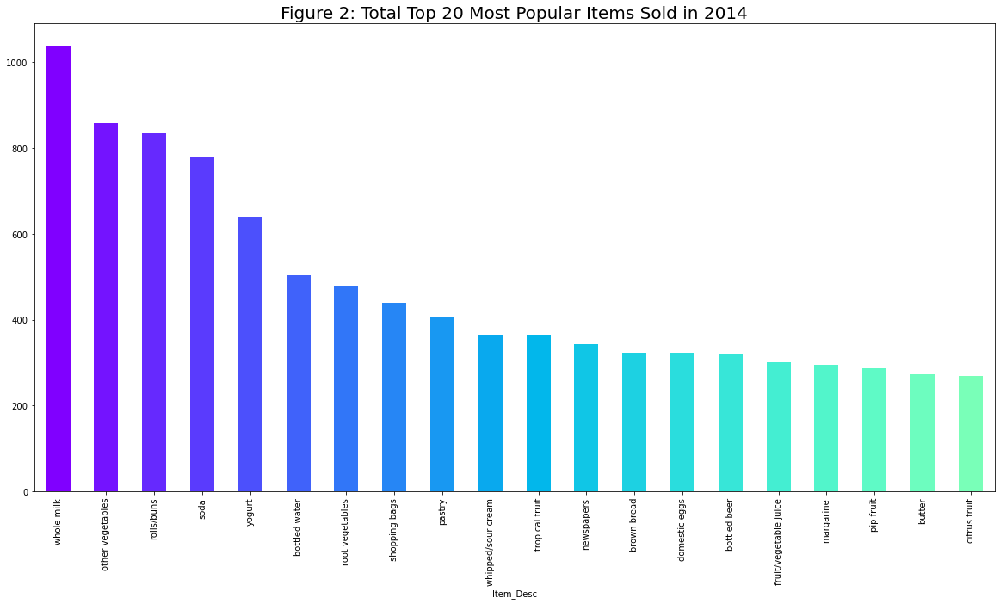

In [159]:
item_date_df.loc['2014-12-31'].groupby(['Item_Desc']).sum().nlargest(20).plot.bar(color = color, figsize=(20,10))
plt.title('Figure 2: Total Top 20 Most Popular Items Sold in 2014', fontsize = 20)

In [160]:
item_date_df.loc['2015-12-31'].describe()

count     167.000000
mean      122.682635
std       206.036203
min         0.000000
25%        14.000000
50%        44.000000
75%       135.500000
max      1464.000000
Name: 2015-12-31 00:00:00, dtype: float64

Text(0.5, 1.0, 'Figure 3: Total Top 20 Most Popular Items Sold in 2015')

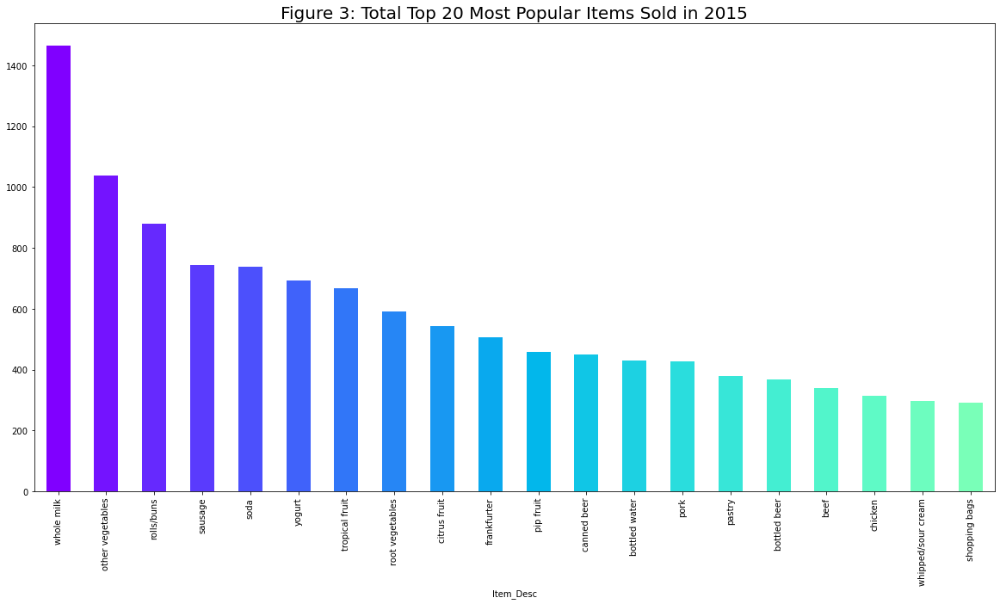

In [161]:
item_date_df.loc['2015-12-31'].groupby(['Item_Desc']).sum().nlargest(20).plot.bar(color = color, figsize=(20,10))
plt.title('Figure 3: Total Top 20 Most Popular Items Sold in 2015', fontsize = 20)

#### *Total Yearly Sales - Count*
A count of the total number of items sold be each year is calculated below. Figure 4 below shows a bar plot of the total count of items sold for 2014 of 963,295 items and for 2015 1,222,078 items which indicates that the total yearly sales have increased. Further analysis would be required to understand the reason for the increase.

In [162]:
item_date_df1 = groce_df[['Date_of_Sale', 'Item_Desc']]
item_date_df1['Total Sales'] = item_date_df1.groupby('Date_of_Sale').transform('count')
item_date_df1.head()

,Date_of_Sale,Item_Desc,Total Sales
0,2015-07-21,tropical fruit,93
1,2015-01-05,whole milk,68
2,2015-09-19,pip fruit,57
3,2015-12-12,other vegetables,43
4,2015-02-01,whole milk,61


In [163]:
item_date_df1 = item_date_df1.set_index('Date_of_Sale')

In [164]:
y_trends_df = item_date_df1.groupby(pd.Grouper(freq='Y')).sum()
y_trends_df = y_trends_df[['Total Sales']]
y_trends_df

,Total Sales
Date_of_Sale,
2014-12-31,963295
2015-12-31,1222078


Text(0.5, 1.0, 'Figure 4: Total Number of Items Sold per Year')

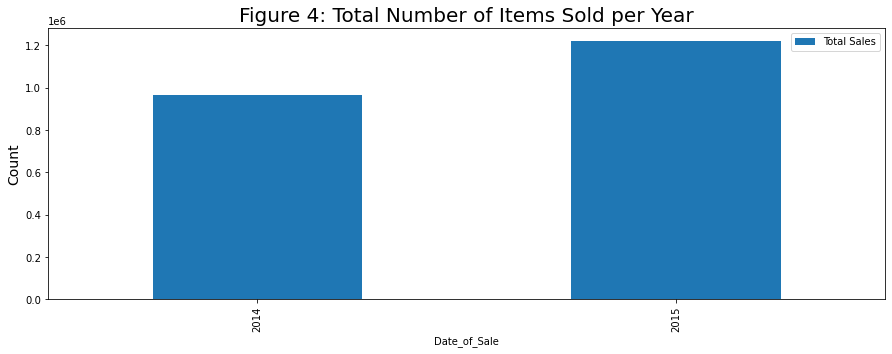

In [165]:
ax=y_trends_df.plot.bar(figsize=(15, 5))
ax.set_ylabel("Count", fontsize=14)
ax.set_xticklabels(['2014','2015'])
plt.title('Figure 4: Total Number of Items Sold per Year', fontsize = 20)

#### *Monthly Sales*
Figure 5 shows the monthly total sales where there are three peaks which may be of interest. The first peak is in December 2014, this can be expected since there are more parties and get togethers around the holiday season. The second peak is around the months of July to September 2015 which is the summer season and once again more get togethers, BBQs, etc are expected, however it is interesting that there is not a similar peak in those months for 2014. Taking a closer look at the items sold between July to September 2015, Figure 6 shows that the top 5 items are consistent with the top items shown in Figure 3. The last peak is November 2015, this can once again be associated with the start of the holiday party season.

Text(0, 0.5, 'Count')

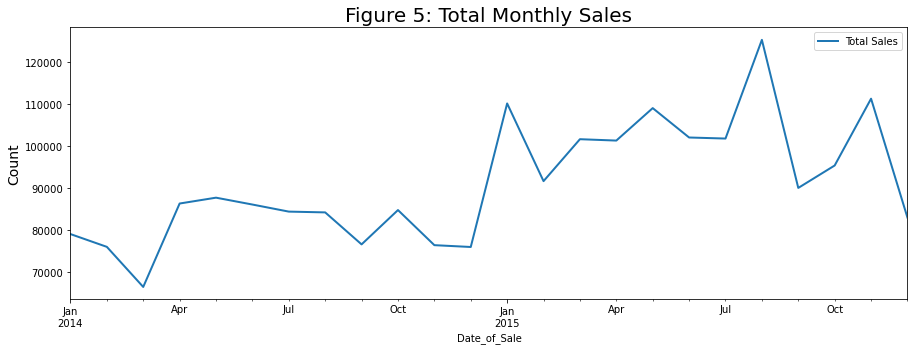

In [166]:
m_trends_df = item_date_df1.groupby(pd.Grouper(freq='M')).sum()
m_trends_df = m_trends_df[['Total Sales']]
ax = m_trends_df.plot(figsize=(15, 5),linewidth = 2)
plt.title('Figure 5: Total Monthly Sales', fontsize = 20)
ax.set_ylabel("Count", fontsize=14)

Text(0.5, 0, 'Item_Desc')

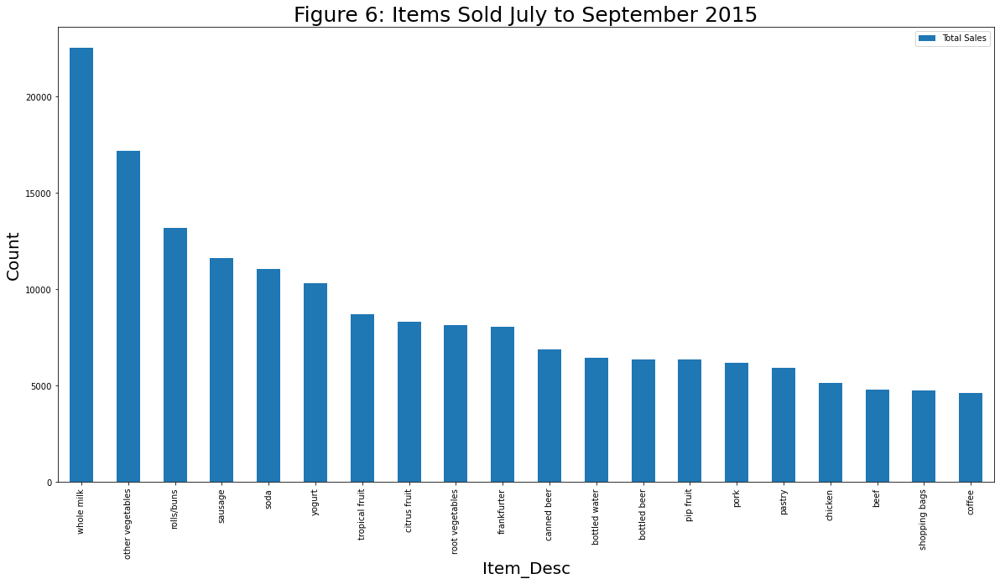

In [167]:
# Products sold from July 1st to September 30th 
ax=item_date_df1.loc['2015-07-01':'2015-09-30' ].sort_values(by=['Total Sales'], ascending=False).groupby(['Item_Desc']).sum().nlargest(20,"Total Sales" ).plot.bar( figsize=(20,10))
plt.title('Figure 6: Items Sold July to September 2015', fontsize = 25)
ax.set_ylabel("Count", fontsize=20)
ax.set_xlabel("Item_Desc", fontsize=20)

#### *Weekly Sales*
Figure 7 shows the total weekly sales; there does not seem to be any overall discernible trends except for consistent two peaks per month. This does indicate that the buying habits of most shoppers is to buy groceries every two weeks. 

Text(0, 0.5, 'Count')

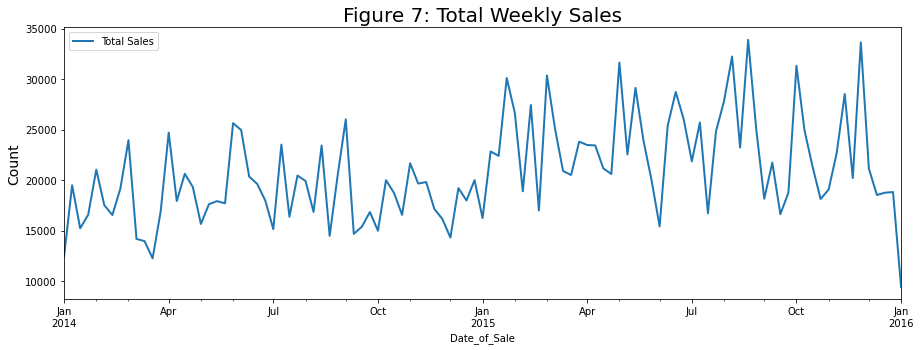

In [168]:
w_trends_df = item_date_df1.groupby(pd.Grouper(freq='W')).sum()
w_trends_df = w_trends_df[['Total Sales']]
ax = w_trends_df.plot(figsize=(15, 5),linewidth = 2 )
plt.title('Figure 7: Total Weekly Sales', fontsize = 20)
ax.set_ylabel("Count", fontsize=14)

#### *Daily Sales*
The total item sales was counted for each day of the week to understand which days are the week have the most sales. Using the Pandas CategoricalDtype function and the Date_of_Sale column the total sales for all items on each day Monday, Tuesday, Wednesday, Thursday, Friday, Saturday and Sunday was counted. 

Figure 8 shows this counted data in the bar plot where it is noted that Monday is the slowest day with the least items sold which is reasonable since most consumers buy groceries over the weekend. Thursday has the highest sales items bought which can be expected as consumers who bought groceries over the weekend have to now go back to the store also some consumers might avoid going to the store on the weekend and go during the week instead.

In [169]:
item_day_df = item_date_df1.copy()
item_day_df = item_day_df.reset_index()

In [170]:
item_day_df.columns

Index(['Date_of_Sale', 'Item_Desc', 'Total Sales'], dtype='object')

In [171]:
item_day_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38765 entries, 0 to 38764
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Date_of_Sale  38765 non-null  datetime64[ns]
 1   Item_Desc     38765 non-null  object        
 2   Total Sales   38765 non-null  int64         
dtypes: datetime64[ns](1), int64(1), object(1)
memory usage: 908.7+ KB


In [172]:
item_day_df['day_of_week'] = pd.to_datetime(item_day_df['Date_of_Sale']).dt.day_name()
item_day_df.dtypes

Date_of_Sale    datetime64[ns]
Item_Desc               object
Total Sales              int64
day_of_week             object
dtype: object

In [173]:
from pandas.api.types import CategoricalDtype

cats = [ 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
cat_type = CategoricalDtype(categories=cats, ordered=True)
item_day_df['day_of_week'] = item_day_df.day_of_week.astype(cat_type)
item_day_df.head()

,Date_of_Sale,Item_Desc,Total Sales,day_of_week
0,2015-07-21,tropical fruit,93,Tuesday
1,2015-01-05,whole milk,68,Monday
2,2015-09-19,pip fruit,57,Saturday
3,2015-12-12,other vegetables,43,Saturday
4,2015-02-01,whole milk,61,Sunday


In [174]:
# Items sold per days [Friday, Monday, Saturday, Sunday, Thursday, Tuesday, Wedsesday]
item_day_df.sort_values(ascending = 'False', by='day_of_week').groupby('day_of_week').Item_Desc.count()

day_of_week
Monday       5382
Tuesday      5558
Wednesday    5562
Thursday     5620
Friday       5562
Saturday     5551
Sunday       5530
Name: Item_Desc, dtype: int64

(285000.0, 340000.0)

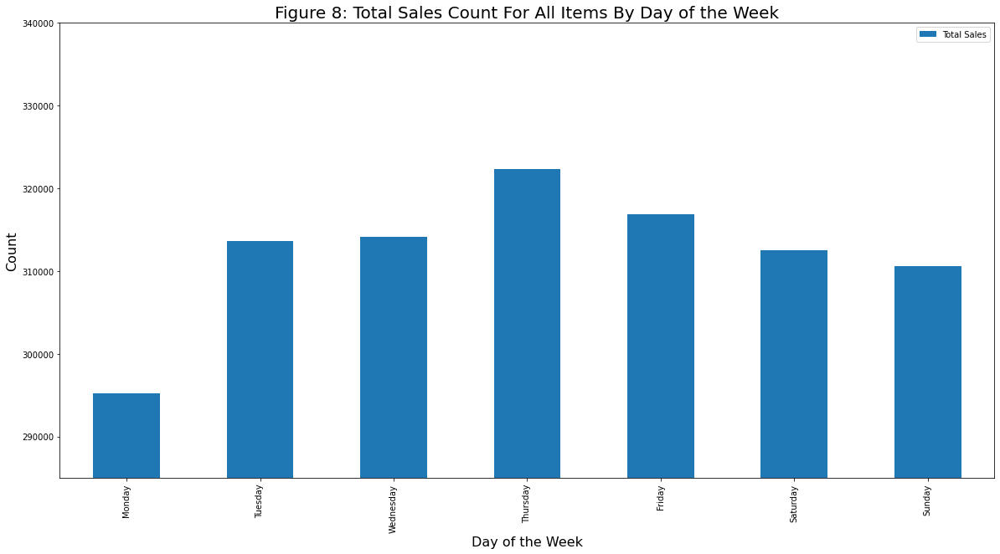

In [175]:
ax = item_day_df.sort_values('day_of_week').groupby('day_of_week').sum().plot(figsize=(20, 10), kind='bar')
plt.title('Figure 8: Total Sales Count For All Items By Day of the Week', fontsize = 20)
ax.set_xlabel('Day of the Week',fontsize=16)
ax.set_ylabel("Count", fontsize=16)
plt.ylim([285000, 340000])

### 2.3 Exploration of the Top 5 Most Selling Items 
A further analysis on the top 5 most selling products from Figure 1 will be explored to understand any additional trends. In order to explore each item a seperate dataframe is created for each of the items. 

The items to be explored are:
 - Whole Milk
 - Other Vegetables
 - Rolls/Buns
 - Soda
 - Yogurt
 


In [176]:
# Top 5 purchased items. 
top_5_df =  groce_df.copy()
top_5_df=top_5_df[['Customer_ID','Item_Desc']].groupby('Item_Desc',as_index=False)['Customer_ID'].count(
    ).sort_values(by='Customer_ID',ascending=False)
top_5_df.rename(columns = {'Customer_ID':'count'},inplace=True)
top_5_df.head()

,Item_Desc,count
164,whole milk,2502
102,other vegetables,1898
122,rolls/buns,1716
138,soda,1514
165,yogurt,1334


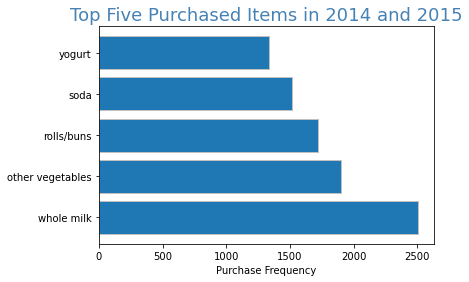

In [177]:
y_axis = top_5_df['Item_Desc'].head(5)
x_axis = top_5_df['count'].head(5)

plt.barh(y_axis,x_axis, edgecolor='Silver')

plt.title('Top Five Purchased Items in 2014 and 2015', color='steelblue',fontsize=18)
plt.xlabel('Purchase Frequency')
plt.show()

#### *Whole Milk*
Figure 9 shows the weekly Whole Milk sales and is then overlapped with the overall weekly sales as shown in Figure 10. The weekly Whole Milk sales generally follow the overall weekly sales except for the months of October to part of December 2014 where there is a little bit of a divergence and Whole Milk sales were lower. Further exploration would be required to understand this difference as there is no obvious reason.

In [178]:
# Creating a dataframe with just Whole Milk
milk_df = item_date_df1[['Item_Desc','Total Sales']][item_date_df1['Item_Desc']=='whole milk']
milk_df.head()

,Item_Desc,Total Sales
Date_of_Sale,,
2015-01-05,whole milk,68
2015-02-01,whole milk,61
2015-03-20,whole milk,81
2015-11-12,whole milk,59
2015-09-05,whole milk,39


Text(0, 0.5, 'Count')

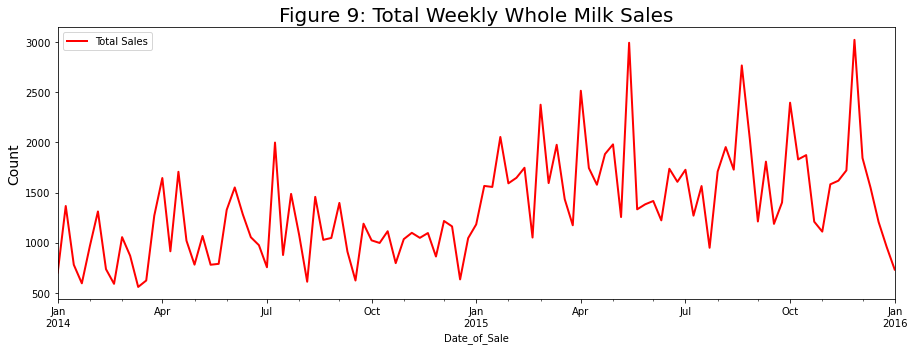

In [179]:
milk_w_trends_df = milk_df.groupby(pd.Grouper(freq='W')).sum()
milk_w_trends_df = milk_w_trends_df[['Total Sales']]
ax=milk_w_trends_df.plot(figsize=(15, 5),linewidth = 2, color='red')
plt.title('Figure 9: Total Weekly Whole Milk Sales', fontsize = 20)
ax.set_ylabel("Count", fontsize=14)

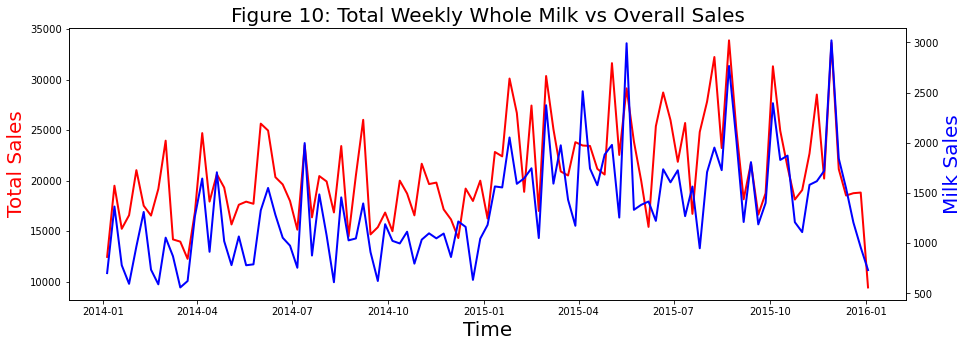

In [180]:
# create figure and axis objects with subplots()
fig,ax = plt.subplots(figsize=(15, 5))
# make a plot
ax.plot(w_trends_df[['Total Sales']], color='red',linewidth = 2)
ax.set_xlabel('Time',fontsize=20)
ax.set_ylabel('Total Sales',color='red',fontsize=20)
ax2=ax.twinx()
# make a plot with different y-axis using second axis object
ax2.plot(milk_w_trends_df[['Total Sales']],color='blue',linewidth = 2)
ax2.set_ylabel("Milk Sales",color="blue",fontsize=20)
plt.title('Figure 10: Total Weekly Whole Milk vs Overall Sales', fontsize = 20)
plt.show()

#### *Other Vegetables*
The weekly sales for Other Vegetables is shown in Figure 11 and along with the overall weekly sales in Figure 12. In Figure 12 the weekly sales for Other Vegetables follows the pattern for overall sales except for the beginning of May 2014 and end of June 2014 where the sales for Other Vegetables went in the opposite direction. There could be a few reasons for this occurance such as supply constraints, availability/seasonality of certain vegetables, etc. 

In [181]:
veg_w_trends_df = item_date_df1[['Item_Desc','Total Sales']][item_date_df1['Item_Desc']=='other vegetables']
veg_w_trends_df = veg_w_trends_df.groupby(pd.Grouper(freq='W')).sum()
veg_w_trends_df = veg_w_trends_df[['Total Sales']]
veg_w_trends_df.head()

,Total Sales
Date_of_Sale,
2014-01-05,515
2014-01-12,741
2014-01-19,849
2014-01-26,637
2014-02-02,838


Text(0, 0.5, 'Count')

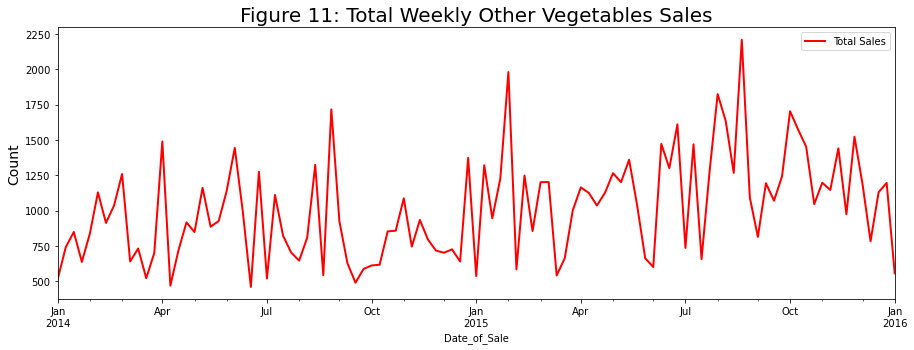

In [182]:
veg_w_trends_df = veg_w_trends_df.groupby(pd.Grouper(freq='W')).sum()
veg_w_trends_df = veg_w_trends_df[['Total Sales']]
ax=veg_w_trends_df.plot(figsize=(15, 5),linewidth = 2, color='red' )
plt.title('Figure 11: Total Weekly Other Vegetables Sales', fontsize = 20)
ax.set_ylabel("Count", fontsize=14)

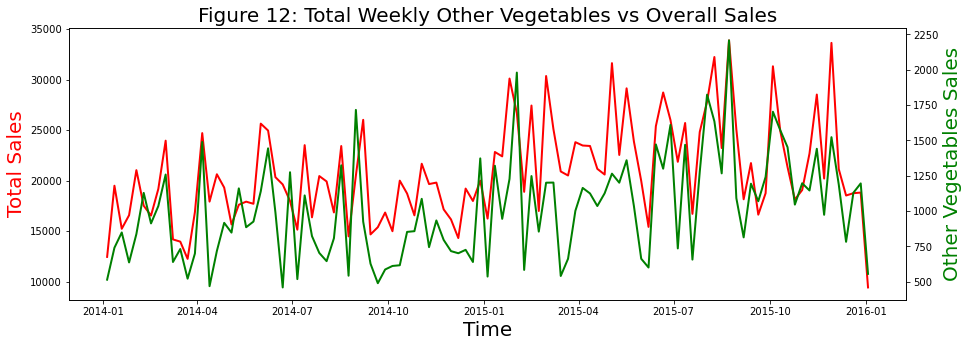

In [183]:
# create figure and axis objects with subplots()
fig,ax = plt.subplots(figsize=(15, 5))
# make a plot
ax.plot(w_trends_df[['Total Sales']], color='red',linewidth = 2)
ax.set_xlabel('Time',fontsize=20)
ax.set_ylabel('Total Sales',color='red',fontsize=20)
ax2=ax.twinx()
# make a plot with different y-axis using second axis object
ax2.plot(veg_w_trends_df[['Total Sales']],color='green',linewidth = 2)
ax2.set_ylabel("Other Vegetables Sales",color="green",fontsize=20)
plt.title('Figure 12: Total Weekly Other Vegetables vs Overall Sales', fontsize = 20)
plt.show()

#### *Rolls/Buns*
Figures 13 and 14 show the weekly sales for rolls/buns seperately and with the overall weekly sales. As shown in Figure 14 both sales follow each other closely which is expected as consumers would purchase rolls/buns year round.

In [184]:
rolls_w_trends_df = item_date_df1[['Item_Desc','Total Sales']][item_date_df1['Item_Desc']=='rolls/buns']
rolls_w_trends_df = rolls_w_trends_df.groupby(pd.Grouper(freq='W')).sum()
rolls_w_trends_df = rolls_w_trends_df[['Total Sales']]
rolls_w_trends_df.head()

,Total Sales
Date_of_Sale,
2014-01-05,531
2014-01-12,923
2014-01-19,1166
2014-01-26,1008
2014-02-02,888


Text(0, 0.5, 'Count')

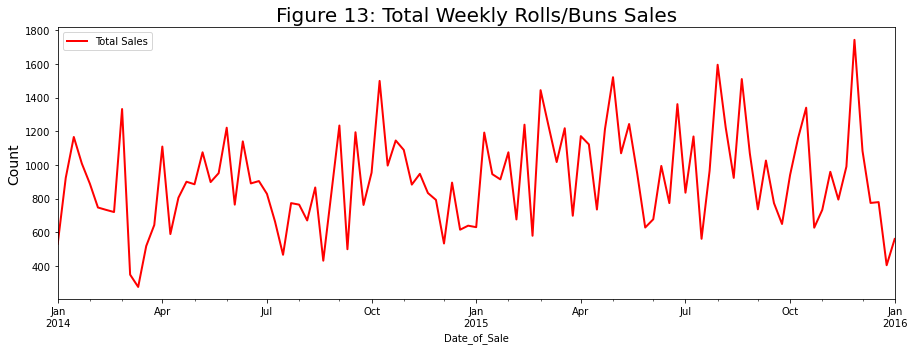

In [185]:
rolls_w_trends_df = rolls_w_trends_df.groupby(pd.Grouper(freq='W')).sum()
rolls_w_trends_df = rolls_w_trends_df[['Total Sales']]
ax = rolls_w_trends_df.plot(figsize=(15, 5),linewidth = 2, color='red')
plt.title('Figure 13: Total Weekly Rolls/Buns Sales', fontsize = 20)
ax.set_ylabel("Count", fontsize=14)

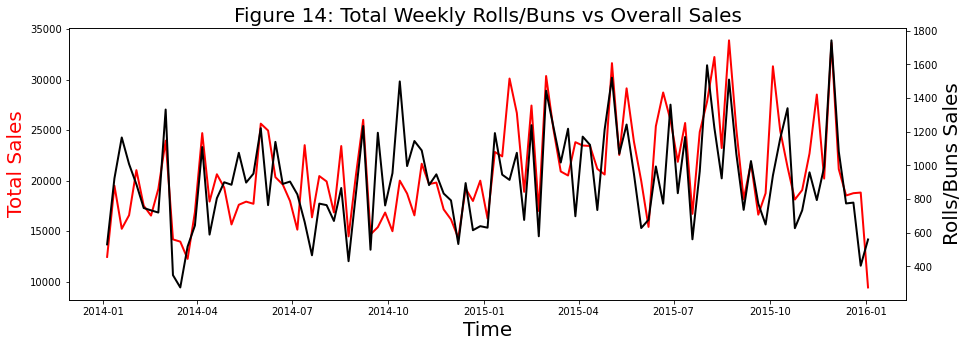

In [186]:
# create figure and axis objects with subplots()
fig,ax = plt.subplots(figsize=(15, 5))
# make a plot
ax.plot(w_trends_df[['Total Sales']], color='red',linewidth = 2)
ax.set_xlabel('Time',fontsize=20)
ax.set_ylabel('Total Sales',color='red',fontsize=20)
ax2=ax.twinx()
# make a plot with different y-axis using second axis object
ax2.plot(rolls_w_trends_df[['Total Sales']],color='black',linewidth = 2)
ax2.set_ylabel("Rolls/Buns Sales",color="black",fontsize=20)
plt.title('Figure 14: Total Weekly Rolls/Buns vs Overall Sales', fontsize = 20)
plt.show()

#### *Soda*
Figures 15 and 16 show the soda weekly sales along with the overall weekly sales. It is interesting to note that the soda sales closely follow the overall sales and at some points are even above the overall weekly sales.

In [187]:
soda_w_trends_df = item_date_df1[['Item_Desc','Total Sales']][item_date_df1['Item_Desc']=='soda']
soda_w_trends_df = soda_w_trends_df.groupby(pd.Grouper(freq='W')).sum()
soda_w_trends_df = soda_w_trends_df[['Total Sales']]
soda_w_trends_df.head()

,Total Sales
Date_of_Sale,
2014-01-05,481
2014-01-12,1188
2014-01-19,805
2014-01-26,370
2014-02-02,873


Text(0, 0.5, 'Count')

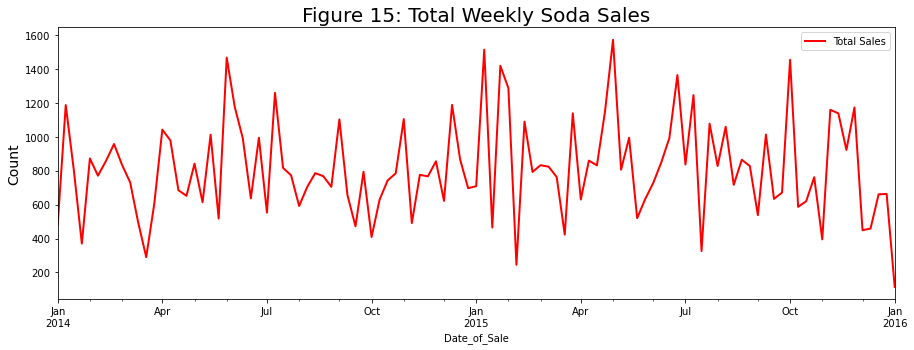

In [188]:
soda_w_trends_df = soda_w_trends_df.groupby(pd.Grouper(freq='W')).sum()
soda_w_trends_df = soda_w_trends_df[['Total Sales']]
ax = soda_w_trends_df.plot(figsize=(15, 5),linewidth = 2, color='red')
plt.title('Figure 15: Total Weekly Soda Sales', fontsize = 20)
ax.set_ylabel("Count", fontsize=14)

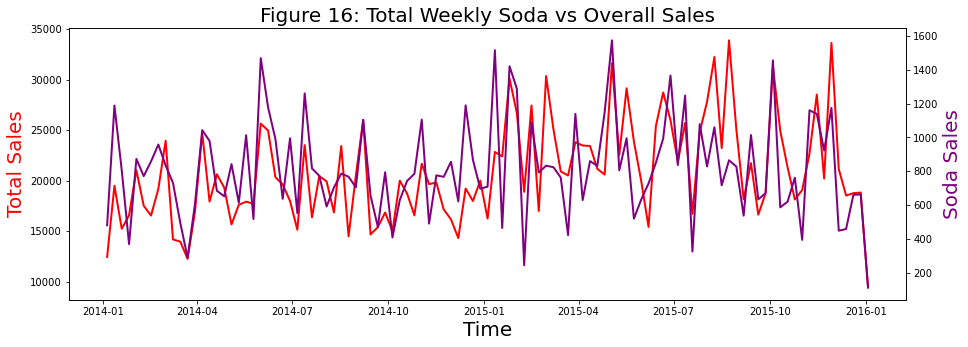

In [189]:
# create figure and axis objects with subplots()
fig,ax = plt.subplots(figsize=(15, 5))
# make a plot
ax.plot(w_trends_df[['Total Sales']], color='red',linewidth = 2)
ax.set_xlabel('Time',fontsize=20)
ax.set_ylabel('Total Sales',color='red',fontsize=20)
ax2=ax.twinx()
# make a plot with different y-axis using second axis object
ax2.plot(soda_w_trends_df[['Total Sales']],color='purple',linewidth = 2)
ax2.set_ylabel("Soda Sales",color="purple",fontsize=20)
plt.title('Figure 16: Total Weekly Soda vs Overall Sales', fontsize = 20)
plt.show()

#### *Yogurt*
The weekly yogurt sales and overall sales are shown in Figures 17 and 18; as shown in Figure 18 the weekly yogurt sales generally follow the overall weekly sales with the exception of a week in August where there is a signnificant spike in yogurt sales. This could be explained that since summer is hot cold yogurt is consumed more.

In [190]:
yog_w_trends_df = item_date_df1[['Item_Desc','Total Sales']][item_date_df1['Item_Desc']=='yogurt']
yog_w_trends_df = yog_w_trends_df.groupby(pd.Grouper(freq='W')).sum()
yog_w_trends_df = yog_w_trends_df[['Total Sales']]
yog_w_trends_df.head()

,Total Sales
Date_of_Sale,
2014-01-05,391
2014-01-12,657
2014-01-19,770
2014-01-26,298
2014-02-02,637


Text(0, 0.5, 'Count')

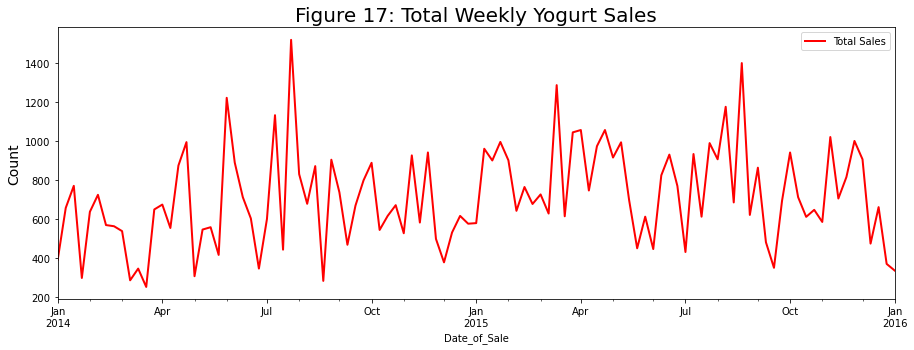

In [191]:
yog_w_trends_df  = yog_w_trends_df .groupby(pd.Grouper(freq='W')).sum()
yog_w_trends_df  = yog_w_trends_df [['Total Sales']]
ax = yog_w_trends_df .plot(figsize=(15, 5),linewidth = 2, color='red')
plt.title('Figure 17: Total Weekly Yogurt Sales', fontsize = 20)
ax.set_ylabel("Count", fontsize=14)

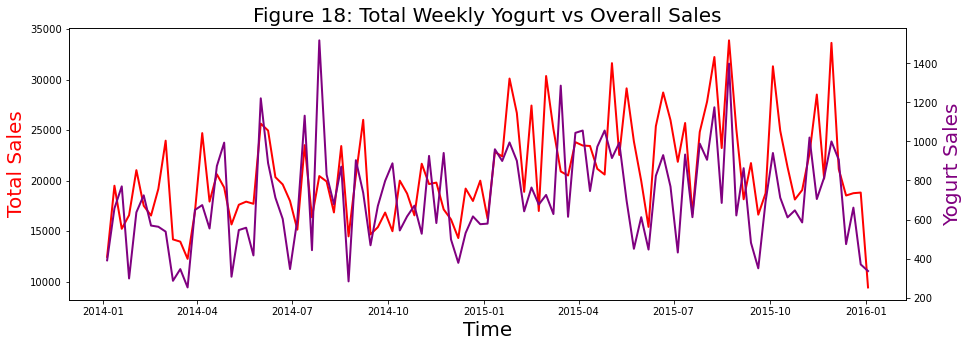

In [192]:
# create figure and axis objects with subplots()
fig,ax = plt.subplots(figsize=(15, 5))
# make a plot
ax.plot(w_trends_df[['Total Sales']], color='red',linewidth = 2)
ax.set_xlabel('Time',fontsize=20)
ax.set_ylabel('Total Sales',color='red',fontsize=20)
ax2=ax.twinx()
# make a plot with different y-axis using second axis object
ax2.plot(yog_w_trends_df[['Total Sales']],color='purple',linewidth = 2)
ax2.set_ylabel("Yogurt Sales",color="purple",fontsize=20)
plt.title('Figure 18: Total Weekly Yogurt vs Overall Sales', fontsize = 20)
plt.show()

## 3. Modelling and Evaluation

### 3.1 Import Libraries
The required libraries are imported to use the Apriori algothrim and association rules. 

In [193]:
pip install mlxtend 

Note: you may need to restart the kernel to use updated packages.


In [194]:
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules

### 3.2 Market Basket Analysis
Market basket analysis in retail is a process that looks for relationships among items that are frequently bought together such as the collection of items in a shopper’s cart. In this dataset the basket contains the quantity of items bought per transaction using *Customer_ID* and *Date_of_Sale* data.

In [195]:
groce_df1 = groce_df.copy()
groce_df1.columns, groce_df1.shape

(Index(['Customer_ID', 'Date_of_Sale', 'Item_Desc'], dtype='object'),
 (38765, 3))

In [196]:
groce_df1.nunique()

Customer_ID     3898
Date_of_Sale     728
Item_Desc        167
dtype: int64

In [197]:
groce_df1.Date_of_Sale = pd.to_datetime(groce_df1.Date_of_Sale) 
groce_df1['Year'] = groce_df1.Date_of_Sale.apply(lambda x : x.year)
groce_df1['Month'] = groce_df1.Date_of_Sale.apply(lambda x : x.month)
groce_df1['Days of Week'] = groce_df1.Date_of_Sale.apply(lambda x : x.dayofweek)
groce_df1.nunique()

Customer_ID     3898
Date_of_Sale     728
Item_Desc        167
Year               2
Month             12
Days of Week       7
dtype: int64

In [198]:
#item_date_df = groce_df[['Item_Desc','Date_of_Sale']] 
basket_df = groce_df1 [['Customer_ID','Item_Desc']]

In [199]:
basket_df['Total Sales'] = basket_df.groupby('Item_Desc').transform('count')
print(basket_df.head(10).to_markdown())

|    |   Customer_ID | Item_Desc        |   Total Sales |
|---:|--------------:|:-----------------|--------------:|
|  0 |          1808 | tropical fruit   |          1032 |
|  1 |          2552 | whole milk       |          2502 |
|  2 |          2300 | pip fruit        |           744 |
|  3 |          1187 | other vegetables |          1898 |
|  4 |          3037 | whole milk       |          2502 |
|  5 |          4941 | rolls/buns       |          1716 |
|  6 |          4501 | other vegetables |          1898 |
|  7 |          3803 | pot plants       |           118 |
|  8 |          2762 | whole milk       |          2502 |
|  9 |          4119 | tropical fruit   |          1032 |


<ipython-input-199-6fff822f5e35>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



#### *Market Basket Contents*

A dataframe called *basket_df* was created, as shown in the table below, which shows all the items that each has customer bought in this dataset i.e. the customer shopping cart. In addition, the table below shows the count for each item in each customers shopping cart i.e. how many times each item was bought. For example, customer 1001 bought *beef* 516 times. This is very useful information for a marketing and sales team as buying patterns/habits can be further analyzed to gain transactional insights.

In [200]:
basket_df=basket_df.groupby(['Customer_ID','Item_Desc'])['Total Sales'].sum().unstack().reset_index().fillna(0).set_index('Customer_ID')
basket_df.head(10)

Item_Desc,Instant food products,UHT-milk,abrasive cleaner,artif. sweetener,baby cosmetics,bags,baking powder,bathroom cleaner,beef,berries,beverages,bottled beer,bottled water,brandy,brown bread,butter,butter milk,cake bar,candles,candy,canned beer,canned fish,canned fruit,canned vegetables,cat food,cereals,chewing gum,chicken,chocolate,chocolate marshmallow,citrus fruit,cleaner,cling film/bags,cocoa drinks,coffee,condensed milk,cooking chocolate,cookware,cream,cream cheese,curd,curd cheese,decalcifier,dental care,dessert,detergent,dish cleaner,dishes,dog food,domestic eggs,female sanitary products,finished products,fish,flour,flower (seeds),flower soil/fertilizer,frankfurter,frozen chicken,frozen dessert,frozen fish,frozen fruits,frozen meals,frozen potato products,frozen vegetables,fruit/vegetable juice,grapes,hair spray,ham,hamburger meat,hard cheese,herbs,honey,house keeping products,hygiene articles,ice cream,instant coffee,jam,ketchup,kitchen towels,kitchen utensil,light bulbs,liqueur,liquor,liquor (appetizer),liver loaf,long life bakery product,make up remover,male cosmetics,margarine,mayonnaise,meat,meat spreads,misc. beverages,mustard,napkins,newspapers,nut snack,nuts/prunes,oil,onions,organic products,organic sausage,other vegetables,packaged fruit/vegetables,pasta,pastry,pet care,photo/film,pickled vegetables,pip fruit,popcorn,pork,pot plants,potato products,preservation products,processed cheese,prosecco,pudding powder,ready soups,red/blush wine,rice,roll products,rolls/buns,root vegetables,rubbing alcohol,rum,salad dressing,salt,salty snack,sauces,sausage,seasonal products,semi-finished bread,shopping bags,skin care,sliced cheese,snack products,soap,soda,soft cheese,softener,soups,sparkling wine,specialty bar,specialty cheese,specialty chocolate,specialty fat,specialty vegetables,spices,spread cheese,sugar,sweet spreads,syrup,tea,tidbits,toilet cleaner,tropical fruit,turkey,vinegar,waffles,whipped/sour cream,whisky,white bread,white wine,whole milk,yogurt,zwieback
Customer_ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,717.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,208.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,238.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,785.0,0.0,0.0,134.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,283.0,0.0,1848.0,0.0,142.0,0.0,0.0,0.0,0.0,0.0,1514.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5004.0,1334.0,0.0
1001,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,516.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,514.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1160.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1716.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,924.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3028.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,662.0,0.0,362.0,0.0,5004.0,0.0,0.0
1002,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,534.0,263.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,425.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,

#### *Market Basket Encoding*

The *basket_df* dataframe is one hot encoded so that it can be used to apply the algorithms required to model. The table below shows a (1) if an item is bought and a (0) if an item was not bought.

A function *encode_units* was created for the transformation. The function works as noted:
 - If the units is equal to or less than 0, the function will change the table value to 0 (not purchased)
 - If the units is more than or equal to 1, the function will change the table value to 1 (purchased)

In [201]:
def encode_units(b):
    if b <= 0:
        return 0
    if b >= 1:
        return 1
    
basket_encode = basket_df.applymap(encode_units)
basket_encode.head()

Item_Desc,Instant food products,UHT-milk,abrasive cleaner,artif. sweetener,baby cosmetics,bags,baking powder,bathroom cleaner,beef,berries,beverages,bottled beer,bottled water,brandy,brown bread,butter,butter milk,cake bar,candles,candy,canned beer,canned fish,canned fruit,canned vegetables,cat food,cereals,chewing gum,chicken,chocolate,chocolate marshmallow,citrus fruit,cleaner,cling film/bags,cocoa drinks,coffee,condensed milk,cooking chocolate,cookware,cream,cream cheese,curd,curd cheese,decalcifier,dental care,dessert,detergent,dish cleaner,dishes,dog food,domestic eggs,female sanitary products,finished products,fish,flour,flower (seeds),flower soil/fertilizer,frankfurter,frozen chicken,frozen dessert,frozen fish,frozen fruits,frozen meals,frozen potato products,frozen vegetables,fruit/vegetable juice,grapes,hair spray,ham,hamburger meat,hard cheese,herbs,honey,house keeping products,hygiene articles,ice cream,instant coffee,jam,ketchup,kitchen towels,kitchen utensil,light bulbs,liqueur,liquor,liquor (appetizer),liver loaf,long life bakery product,make up remover,male cosmetics,margarine,mayonnaise,meat,meat spreads,misc. beverages,mustard,napkins,newspapers,nut snack,nuts/prunes,oil,onions,organic products,organic sausage,other vegetables,packaged fruit/vegetables,pasta,pastry,pet care,photo/film,pickled vegetables,pip fruit,popcorn,pork,pot plants,potato products,preservation products,processed cheese,prosecco,pudding powder,ready soups,red/blush wine,rice,roll products,rolls/buns,root vegetables,rubbing alcohol,rum,salad dressing,salt,salty snack,sauces,sausage,seasonal products,semi-finished bread,shopping bags,skin care,sliced cheese,snack products,soap,soda,soft cheese,softener,soups,sparkling wine,specialty bar,specialty cheese,specialty chocolate,specialty fat,specialty vegetables,spices,spread cheese,sugar,sweet spreads,syrup,tea,tidbits,toilet cleaner,tropical fruit,turkey,vinegar,waffles,whipped/sour cream,whisky,white bread,white wine,whole milk,yogurt,zwieback
Customer_ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0
1001,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0
1002,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0
1003,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1004,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0


In [202]:
basket_filter = basket_encode [(basket_encode > 0).sum(axis=1) >= 2]
basket_filter.head(2)

Item_Desc,Instant food products,UHT-milk,abrasive cleaner,artif. sweetener,baby cosmetics,bags,baking powder,bathroom cleaner,beef,berries,beverages,bottled beer,bottled water,brandy,brown bread,butter,butter milk,cake bar,candles,candy,canned beer,canned fish,canned fruit,canned vegetables,cat food,cereals,chewing gum,chicken,chocolate,chocolate marshmallow,citrus fruit,cleaner,cling film/bags,cocoa drinks,coffee,condensed milk,cooking chocolate,cookware,cream,cream cheese,curd,curd cheese,decalcifier,dental care,dessert,detergent,dish cleaner,dishes,dog food,domestic eggs,female sanitary products,finished products,fish,flour,flower (seeds),flower soil/fertilizer,frankfurter,frozen chicken,frozen dessert,frozen fish,frozen fruits,frozen meals,frozen potato products,frozen vegetables,fruit/vegetable juice,grapes,hair spray,ham,hamburger meat,hard cheese,herbs,honey,house keeping products,hygiene articles,ice cream,instant coffee,jam,ketchup,kitchen towels,kitchen utensil,light bulbs,liqueur,liquor,liquor (appetizer),liver loaf,long life bakery product,make up remover,male cosmetics,margarine,mayonnaise,meat,meat spreads,misc. beverages,mustard,napkins,newspapers,nut snack,nuts/prunes,oil,onions,organic products,organic sausage,other vegetables,packaged fruit/vegetables,pasta,pastry,pet care,photo/film,pickled vegetables,pip fruit,popcorn,pork,pot plants,potato products,preservation products,processed cheese,prosecco,pudding powder,ready soups,red/blush wine,rice,roll products,rolls/buns,root vegetables,rubbing alcohol,rum,salad dressing,salt,salty snack,sauces,sausage,seasonal products,semi-finished bread,shopping bags,skin care,sliced cheese,snack products,soap,soda,soft cheese,softener,soups,sparkling wine,specialty bar,specialty cheese,specialty chocolate,specialty fat,specialty vegetables,spices,spread cheese,sugar,sweet spreads,syrup,tea,tidbits,toilet cleaner,tropical fruit,turkey,vinegar,waffles,whipped/sour cream,whisky,white bread,white wine,whole milk,yogurt,zwieback
Customer_ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0
1001,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0


### 3.3 Applying the Apriori Algorithm

Apriori is a popular algorithm for extracting frequent itemsets and has been designed to operate on databases containing transactions, such as purchases by customers of a store. An itemset is considered as "frequent" if it meets a user-specified support threshold. For instance, if the support threshold is set to 0.5 (50%), a frequent itemset is defined as a set of items that occur together in at least 50% of all transactions in the database.

#### *Support*
A minimum support value of 0.03 is chosen as it provides a sufficient number of itemsets for further analysis. For example, with a minimum support of 0.03 there are 415 itemsets when the apriori algorithm is applied. When the minimum support is increased to 0.06 then the algorithm results in only 116 itemsets which is very small.

The minimum support threshold could potentially be increased if the size of the dataset also increases.

In [203]:
# Support of the association rules is the number of transaction that contains all item of both antecedents and consequents
frequent_products = apriori(basket_filter, min_support=0.03,
                            use_colnames=True).sort_values('support', ascending=False).reset_index(drop=True)
frequent_products['no_of_item'] = frequent_products['itemsets'].apply(lambda x: len(x))
frequent_products

,support,itemsets,no_of_item
0,0.458633,(whole milk),1
1,0.376670,(other vegetables),1
2,0.350206,(rolls/buns),1
3,0.313720,(soda),1
4,0.283402,(yogurt),1
...,...,...,...
410,0.030062,"(canned beer, brown bread)",2
411,0.030062,"(whole milk, other vegetables, pork)",3
412,0.030062,"(pastry, frankfurter)",2
413,0.030062,"(shopping bags, newspapers)",2


As it relates to the business problem, the focus is to look at product placement for groups of items, as such a filter is applied for only those transactions with more than one item in the itemset as shown in the table below.

In [204]:
# the number of item that is bought >= 2
frequent_products[frequent_products['no_of_item'] >= 2] 


,support,itemsets,no_of_item
9,0.191675,"(whole milk, other vegetables)",2
11,0.178828,"(whole milk, rolls/buns)",2
18,0.151336,"(whole milk, soda)",2
19,0.150822,"(whole milk, yogurt)",2
20,0.146968,"(other vegetables, rolls/buns)",2
...,...,...,...
410,0.030062,"(canned beer, brown bread)",2
411,0.030062,"(whole milk, other vegetables, pork)",3
412,0.030062,"(pastry, frankfurter)",2
413,0.030062,"(shopping bags, newspapers)",2


#### *Lift*

Association rules can now be applied to the Apriori algorithm results in the table above. In order for an association rule to be considered relavant, the lift value needs to be at least 1. In this case the association rules are applied in the table shown below based on minimum lift value of 1.03 which says that there is at a possibility of two items being sold together. 

The table below shows the antecendents and consequents where the minimum support is 0.03 and the minimum lift is 1.03. The confidence is also calcuated for each association. Analysis on the first association (yogurt, rolls/buns) -> (other vegetables, whole milk) shows that the lift is 1.61 which indicates that these two itemsets have a 1.61 times probability of being sold together. Also to note is that the second association is the same itemsets (other vegetables, whole) -> (yogurt, rolls/buns) with the same lift but with the association going in the opposite direction. Another interesting observation for these two associations is the confidence in the first itemset is 0.308 vs 0.179 in the second which be interpreted as a shopper coming to buy (yogurt, rolls/buns) are more likely to by (other vegetables, whole) vs the other way around. There are currently 1,032 association rules generated with a minimum support of 0.03 and minimum lift of 1.03.

In [205]:
assoc_df = association_rules(frequent_products, metric= 'lift',
                  min_threshold=1.03).sort_values('lift', ascending=False).reset_index(drop=True)

assoc_df.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,"(yogurt, rolls/buns)","(whole milk, other vegetables)",0.111511,0.191675,0.034430,0.308756,1.610828,0.013056,1.169376
1,"(whole milk, other vegetables)","(yogurt, rolls/buns)",0.191675,0.111511,0.034430,0.179625,1.610828,0.013056,1.083028
2,"(other vegetables, yogurt)","(whole milk, rolls/buns)",0.120504,0.178828,0.034430,0.285714,1.597701,0.012880,1.149640
3,"(whole milk, rolls/buns)","(other vegetables, yogurt)",0.178828,0.120504,0.034430,0.192529,1.597701,0.012880,1.089198
4,"(whole milk, yogurt)","(other vegetables, rolls/buns)",0.150822,0.146968,0.034430,0.228279,1.553258,0.012264,1.105364
5,"(other vegetables, rolls/buns)","(whole milk, yogurt)",0.146968,0.150822,0.034430,0.234266,1.553258,0.012264,1.108972
6,"(yogurt, rolls/buns)",(sausage),0.111511,0.206321,0.035714,0.320276,1.552324,0.012707,1.167650
7,(sausage),"(yogurt, rolls/buns)",0.206321,0.111511,0.035714,0.173101,1.552324,0.012707,1.074483
8,"(sausage, rolls/buns)",(yogurt),0.082477,0.283402,0.035714,0.433022,1.527943,0.012340,1.263890
9,(yogurt),"(sausage, rolls/buns)",0.283402,0.082477,0.035714,0.126020,1.527943,0.012340,1.049822


In [206]:
#Number of association rules in the dataset
rows = assoc_df.shape[0]
print(f'Number of rules: {rows}')

Number of rules: 1032


The outputs below show the mean and ranges for the support, lift and confidence; further analysis of this can be conducted for insights. 

In [207]:
assoc_df['support'].describe()

count    1032.000000
mean        0.045843
std         0.020523
min         0.030062
25%         0.033402
50%         0.039568
75%         0.049910
max         0.191675
Name: support, dtype: float64

In [208]:
assoc_df['confidence'].describe()

count    1032.000000
mean        0.266306
std         0.146431
min         0.065546
25%         0.146830
50%         0.229071
75%         0.384717
max         0.656863
Name: confidence, dtype: float64

In [209]:
assoc_df['lift'].describe()

count    1032.000000
mean        1.198933
std         0.094421
min         1.037458
25%         1.128199
50%         1.190082
75%         1.253408
max         1.610828
Name: lift, dtype: float64

### 3.4 Itemset Visualization

For further analysis a new dataframe *rules_df* is created using the same minimum support value of 0.03 however the lift has been increased to 1.4 so that itemsets with a higher probability of being sold together are shown. This creates better visuals without reducing the association rules too significantly.

It is shown by counting the rows for the new dataframe *rules_df* that there are now 32 association rules.

In [210]:
rules_df = association_rules(frequent_products, metric= 'lift',
                  min_threshold=1.4).sort_values('lift', ascending=False).reset_index(drop=True)

In [211]:
#Number of association rules in the dataset
rows = rules_df.shape[0]
print(f'Number of rules: {rows}')

Number of rules: 32


#### Heatmap with Lift

A heatmap was created to show itemsets and the associated lift values for each set as shown in Figure 19. If the lift value is greater than 1.4, the two itemsets occur in transactions together more than expected based on their individual support values.

As shown in Figure 19 the largest lift value is 1.6 for four itemsets:
 - yogurt/whole milk and other vegetables/rolls/buns
 - other vegetables/whole milk and yogurt/rolls/buns
 - sausage and yogurt/rolls/buns
 - whole milk/rolls/buns and yogurt/other vegetables

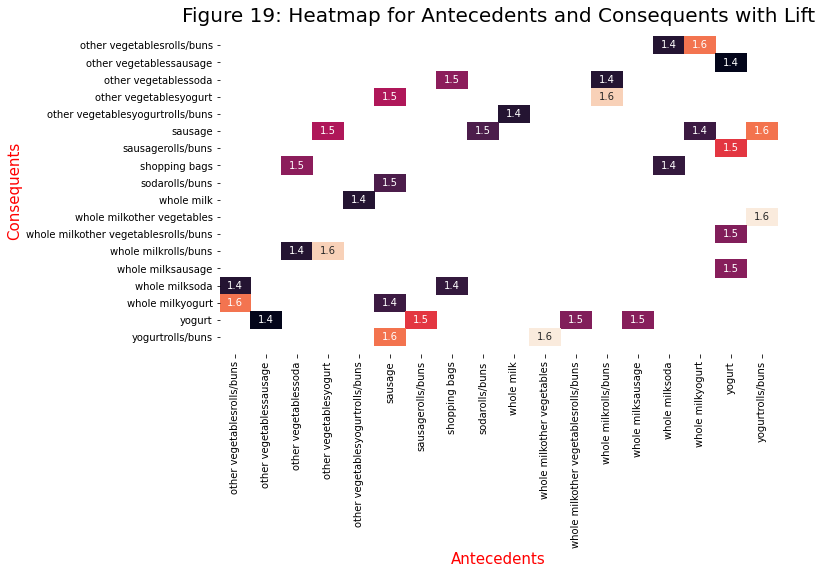

In [213]:
# Convert antecedents and consequents into strings
rules_df['antecedents'] = rules_df['antecedents'].apply(lambda a: ''.join(list(a)))
rules_df['consequents'] = rules_df['consequents'].apply(lambda a: ''.join(list(a)))

# Transform antecedent, consequent, and support columns into matrix
support_table = rules_df.pivot(index='consequents', columns='antecedents', values='lift')

plt.figure(figsize=(10,6))
ax=sns.heatmap(support_table, annot=True, cbar=False)
b, t = plt.ylim() 
b += 0.5 
t -= 0.5 
plt.ylim(b, t) 
plt.yticks(rotation=0)
ax.set_xlabel('Antecedents',color='red',fontsize=15)
ax.set_ylabel('Consequents',color='red',fontsize=15)
plt.title('Figure 19: Heatmap for Antecedents and Consequents with Lift', fontsize = 20)
plt.show() 

#### Scatterplot of Support, Confidence and Lift

Figure 20 below shows a scatterplot of the support, confidence and lift. As shown below the highest lift values are found with a support value close to 0.034 and a confidence range between 0.18 and 0.35.

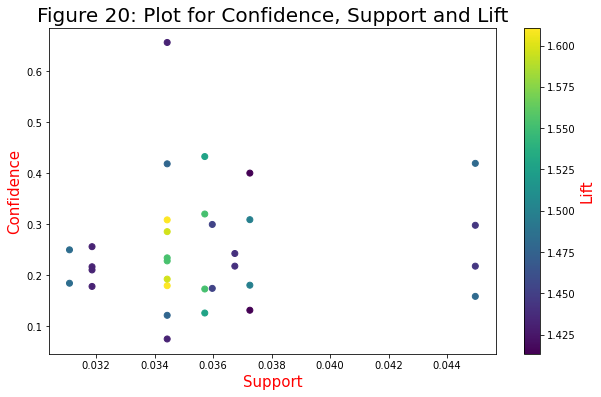

In [242]:
from matplotlib.pylab import *

sup = rules_df['support'].values
conf = rules_df['confidence'].values
lift = rules_df['lift'].values

plt.figure(figsize=(10,6))
sc = plt.scatter(sup,conf,c=lift)
plt.colorbar(sc,label='Lift').set_label(label='Lift',size=15,color='red')
plt.xlabel('Support',color='red',fontsize=15)
plt.ylabel('Confidence',color='red',fontsize=15)
plt.title('Figure 20: Plot for Confidence, Support and Lift', fontsize = 20)
plt.show()

## 4. Web Application

A web application has been developed for users to be able to interact with the model data. Users would be internal to the retail company such as data analysts, marketing analysts and sales analysts.

### 4.1 Web Application Development

#### App Development Tools and Requirements

* **Jupyter Notebook** -  is a server-client application that allows editing and running notebook documents via a web browser. It supports over 40 programming languages and this includes the needed Python libraries being used in this project.


* **Python IDE** - in this study Pycharm was used as the Python IDE to help speed up the development of the app which offers advantages like code highlighting, tooltips, syntax checker, code linters that check for style issues, version control to safeguard the history of programming edits & debugging. This tool has been helpful to accelerate significantly programming activity as compared to using only text editor applications or even Jupyter Notebook. Although, Jupyter Notebook is the environment where the app code is initially created but the enhancement of the app is done in PyCharm.
<br>

* **Heroku** - is a well-loved platform for deploying hobbyist web applications for free which is also scalable to level-enterprise deployments. Heroku provides the physical hardware (storage, compute), software services (linux/unix/sql), and dependencies (packages), in a containerised environment to deploy and host application on a publicly accessible URL (end-point). 
<br>
* **Github** - the main repository of this project. Heroku natively supports deploying repositories that reside in GitHub. Once project is already in a GitHub repository (free for private/public repos) then it can easily be deployed in Heroku after a few additional requirements that are outlined in the deployment guides in Heroku. One of which is Gunicorn.
<br>
* **Gunicorn** - is a production-ready HTTP server specifically for Python web applications which runs natively in Unix. The local HTTP server (shipped with your Python installation) is automatically run by the Python Kernel when dash app is executed on the local machine. However, the said server is not designed for handling incoming traffic from a production website and so when it is deployed to the web, it needs a production-ready HTTP server. A popular one is Gunicorn. What needs to be done is to add a single line of code to dash app (‘server = app.server’), add Gunicorn into the requirements.txt so that it is installed as a package on the local machine (and by Heroku during deployment). It needs to be referenced it in a special file called the Procfile. 
<br>
* **Flask** - Collection of modules and libraries to abstract away hard things in web like protocols and threads. Flask is the underlying web application that sits under Dash. Dash is, in essence, a Flask application.
<br>
* **Plotly.js** - A javascript library that allows access to powerful ecosystem of data visalisations (40 chart types) that run responsively client side. Dash is built on top of this library. The library itself is built on top of d3.js and stack.gl. 
<br>
* **Dash** - Web application that allows entire website to be written in Python by wrapping web components and facilitating 2-way communication (callbacks)
<br>
* **Runtime.txt** - this is one of the special files which needs to be included to get the python project deployed to Heroku as outlined in the deployment guide.

#### Dash Application Python Codes

<code>
import json
import dash
from dash import dcc
from dash import html
import numpy as np
import pandas as pd
from dash.dependencies import Input, Output, State
import plotly.express as px
import plotly.graph_objects as go
</code>
<code>
rules_df1 = pd.read_csv('rules_df1.csv',sep = ',')
rules_dfc = pd.read_csv('rules_dfc.csv',sep = ',')
</code>
<code>
colors = {
    'background': '#111111',
    'text': '#7FDBFF'
}
</code>
<code>
colorscales = px.colors.named_colorscales()
</code>
<code>
default_fig = px.scatter(rules_df1, x ='support', y = 'confidence', color= 'support', size='support',
                color_continuous_scale=px.colors.qualitative.Antique,
                width=900, height=500, hover_data=['lift','antecedents','consequents'])
</code>
<code>
default_fig.update_layout(margin=dict(l=20, r=20, t=20, b=20), paper_bgcolor="LightSteelBlue",)
</code>
<code>
app = dash.Dash(__name__)
server = app.server
</code>

<code>
app.layout = html.Div(style={'backgroundColor': colors['background']},
        children = [
                html.H1(children="RETAIL MARKET BASKET VISUALIZER (RMBV)",
                            style={'textAlign': 'center','color': colors['text']}
                       ),
                html.P(children="Retailer's Tool to Optimize Daily Grocery Sales",
                            style={'textAlign': 'center','color': colors['text']}
                        ),
</code>
<code>
                dcc.Markdown('''
                #### RMBV Key Features:
                * Discover more product combinations which can optimize store sales by adjusting slider in the plot
                * Hover over scatter points to see which products can be synergized for in-store placement and promotion''',
</code>
<code>
                    style={'textAlign': 'left','color':colors['text']}
                        ),
</code>
<code>
                dcc.Slider(id='width', min=500, max=1000, step=50, value=500,
                               marks={x: str(x) for x in [500, 550, 600, 650, 700, 750, 800, 850,900, 950, 1000]}),
                dcc.Graph(id="graph", figure=default_fig),
                    ])
</code>
<code>
@app.callback(
    Output("graph", "figure"),
    [Input('width', 'value')], 
    [State("graph", "figure")])
</code>
<code>
def resize_figure(width, fig_json):
    fig = go.Figure(fig_json)
    fig.update_layout(width=int(width))
    return fig
</code>
<code>
if __name__ == "__main__":
    app.run_server(debug=True)
</code>

#### Local HTPP Console Feedback

<code>/Users/oliverjohncabasan/PycharmProjects/app2/venv/bin/python /Users/oliverjohncabasan/Documents/GitHub/Bees_App/Pycharm_debug/app.py
Dash is running on http://127.0.0.1:8050/
* Serving Flask app 'app' (lazy loading)
* Environment: production
<br>
WARNING: This is a development server. Do not use it in a production deployment.
<br>
Use a production WSGI server instead.
* Debug mode: on </code>

### 4.2 Web Application Deployment

#### Pre-deployment in GITHUB Repository

The analysis of this study is done in a Jupyter python environment with Github as the main repository of the entire project (including the web app) as this would ensure that collaboration and consolidation of the data analysis is streamlined between contributors of this project. Thus, any updates are made directly to the central repository. 

The version control system is facilitated by a GITHUB interface (GUI) which ensures main files in the repository are cloned and replicated into local computers where the repository is distributed. Likewise, it uploads into Github repository for any changes made in the local computers which is done by submitting commits and pull requests at Github.

**URL: https://github.com/oliverjohncabasan/CSDA-1040-Group4-A1**

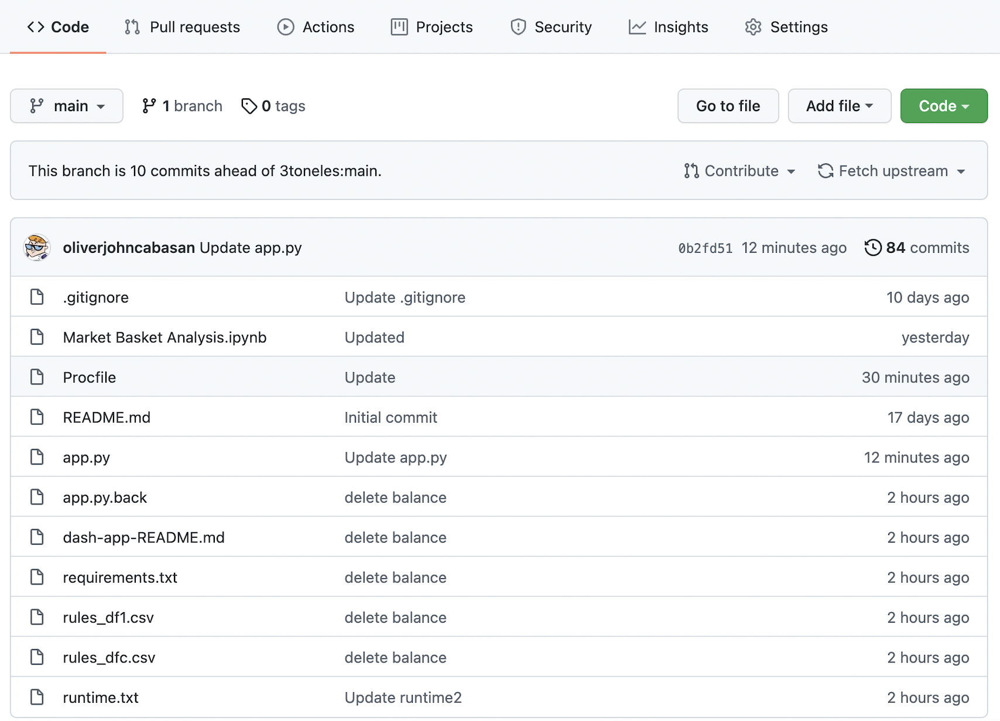

#### Web Application Deployment Through Heroku

The web app development and deployment of this study is directly being loaded from the Github repository using Heroku - a container-based cloud Platform as a Service (PaaS) which is being used to deploy, manage and scale modern apps on the cloud. The platform supports apps created by any of several programming languages including python as used in this study. It allows free deployment of the app hosted in Github repository.

Heroku integrates with GitHub to make it easy to deploy code living on GitHub to apps running on Heroku. When GitHub integration is configured for a Heroku app, Heroku can automatically build and release (if the build is successful) pushes to the specified GitHub repo.

The advantage of using Heroku as opposed to creating your own virtual private server (VPS) running on Linux or Windows operating system is the time and overhead that comes along in maintaining a server.


#### *Deployment Steps*:
 - **Create an account**: This would require creation of an account in the Heroku website at http://heroku.com. When entering the required email, it is advisable to use the same email address for heroku, github, and to use an email account where user can log into immediately. Heroku will then send an activation email where an activation link is found. This will take the user eventually to the Heroku site where account owner needs to confirm password before hitting "Save".

 - **Create a new app and give it a name**: The app name is preferablly short and catchy as it would appear in the website URL after deployment.

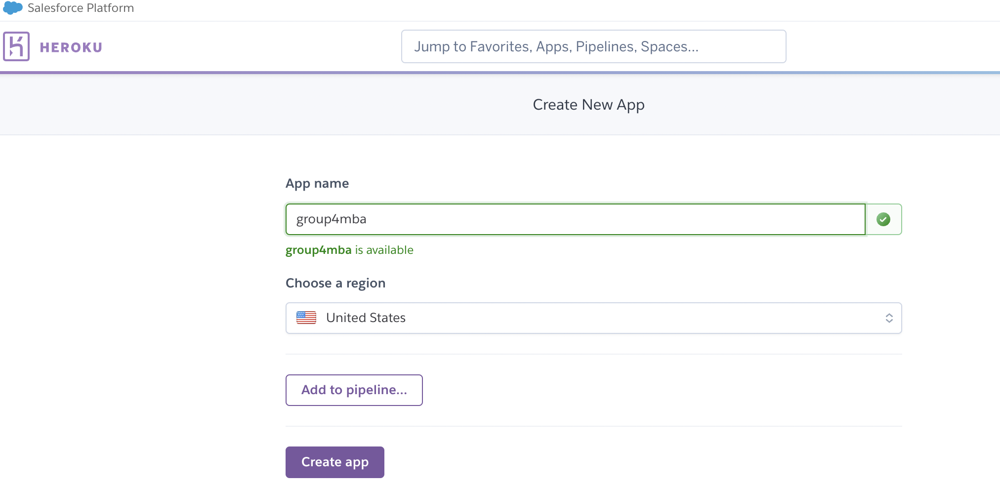

 - **Select Github as method of deployment**: This method is the most common and also the simplest: pushing code from a Github repository to a Heroku app. This is done by adding Heroku app as a remote to an existing Github repository. Because this method requires a developer with full access to manually push code to production, this project is suited for this kind of study that involves pre-production deployments with small trusted teams. 

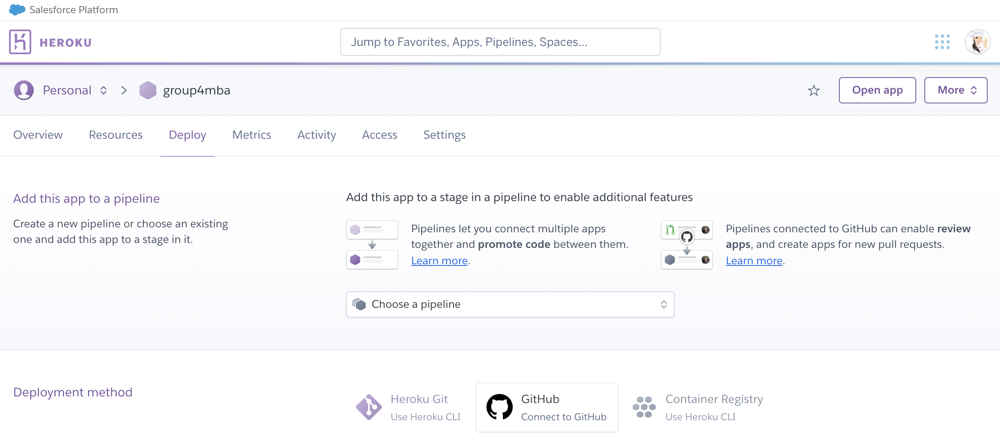

- **Map Heroku to the Github repository where the app is located**: This will link the repository to the Heroku app, changes that are pushed to the repository are automatically deployed to the app. Automatic deployments can also be configured for a specific branch. For this study, main branch - CSDA-1040-Group4-A1 is being used for the deployment. 

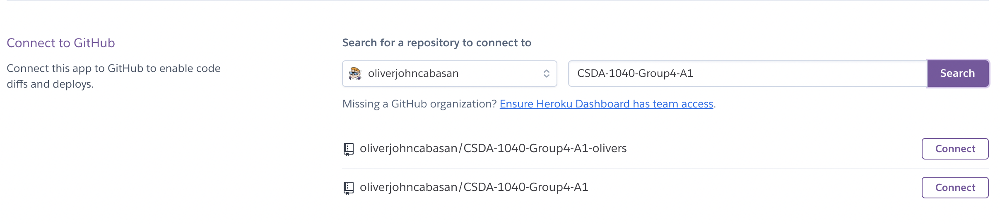

* **Deploy and pre-view the deployment**. Deploying an app is easy as clicking a button with the "deploy to Heroku"button. This feature is helpful for taking an app for a test run with default setting in a single click. This button acts as a shortcut allowing you to deploy an app to Heroku from a web browser. This allows this study to be shared to users or customers prior to final deployment. 

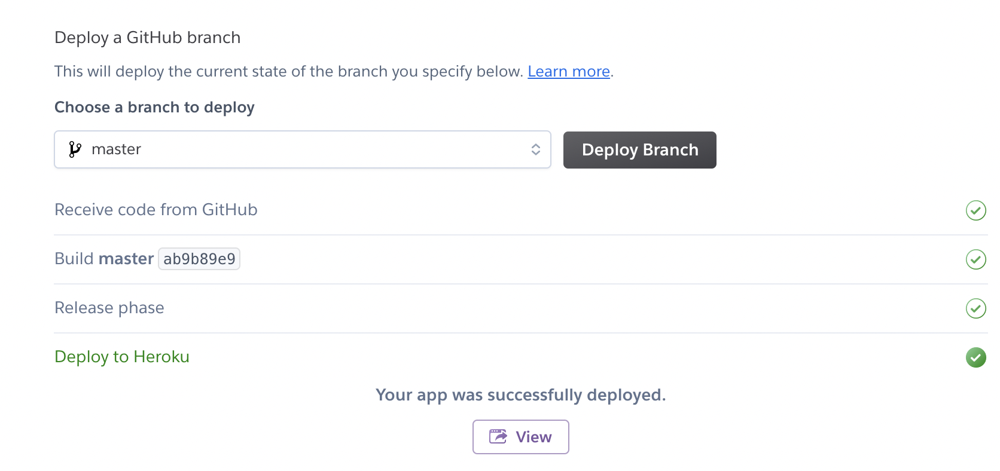

* Logs are displayed prior to launching of the app where a "View" button eventually appears. 
<br>
<br>
    -------> Building on the Heroku-20 stack
<br>
    -------> Using buildpack: heroku/python
<br>
    -------> Python app detected
<br>
    -------> Using Python version specified in runtime.txt
<br>
    -------> No change in requirements detected, installing from cache
<br>
    -------> Using cached install of python-3.9.7
<br>
    -------> Installing pip 20.2.4, setuptools 47.1.1 and wheel 0.36.2
<br>
    -------> Installing SQLite3
<br>
    -------> Installing requirements with pip
<br>
    -------> Discovering process types
<br>
       Procfile declares types -> web
<br>
    -------> Compressing...
<br>
       Done: 205.1M
<br>
    -------> Launching...
<br>
       Released v5
       https://group4mba.herokuapp.com/ deployed to Heroku!

The launching and monitoring for possible errors of the app can also be viewed in the Command Line Interface of Heroku (CLI) by using "heroku logs --tail" command. Errors can appear if the app has certain issues which needs to be resolved. This would require installation of the Heroku CLI and logging in to Heroku using "heroku log-in" command.  

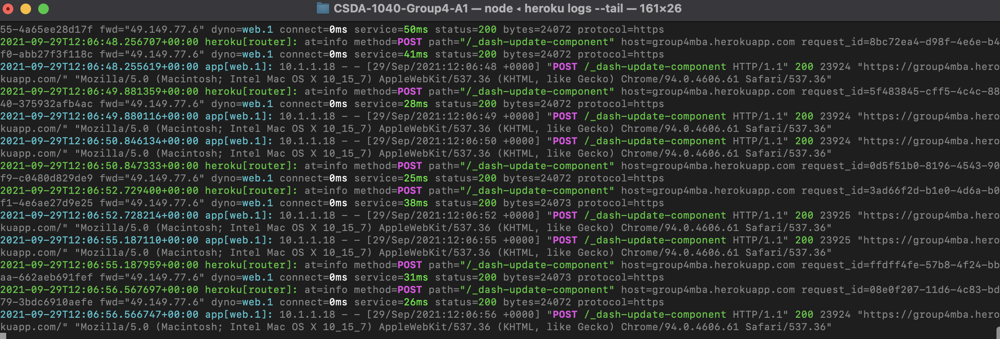

### 4.3 Web Application Production

**DASH APP URL: https://group4mba.herokuapp.com/**

**MAIN GITHUB URL: https://github.com/3toneles/CSDA-1040-Group4-A1**

**DASH APP URL: https://github.com/oliverjohncabasan/CSDA-1040-Group4-A1**

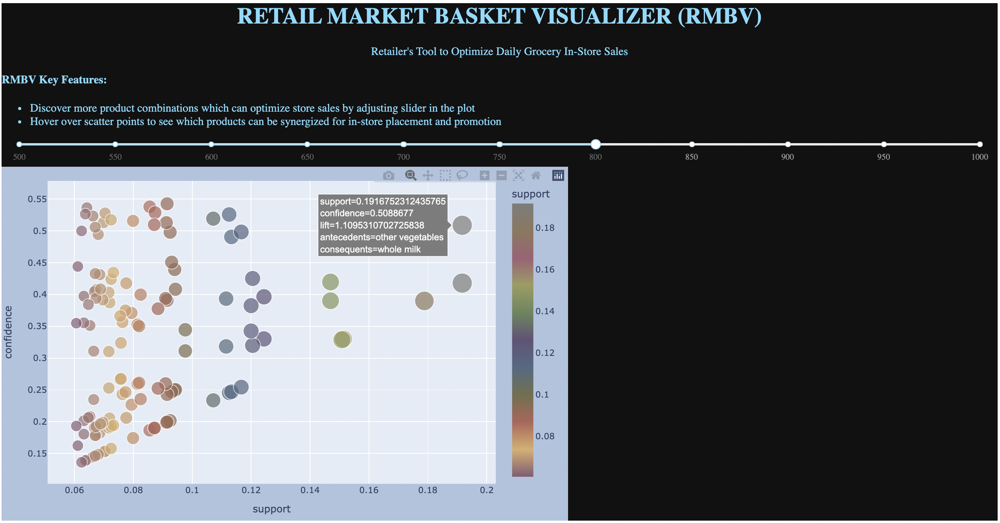

## 5.0 Conclusion and Recommendations

### 5.1 Conclusion

This study has addressed the technique of Market Basket Analysis, which is used in retailing to find relationships between products. The strength of the associations between products can be measured by the three measures: support, confidence and lift. The literature review of this study evaluates different models of the Apriori algorithm which can be applied to perform Market Basket Analysis. The implementation of theses algorithms can help retailers in decision making particularly on optimizing sales by leveraging on products that are strongly associated with each other. The steps in our methodology are to obtain point of sales data, clean data, explore, implement different algorithms and extract useful associations. The insights coming from the analysis can impact and recommend new store layout for retailers and guide them in their promotions that are highly effective starting from products that have strong associations with other items. This is highly evident especially on products which are frequently bought by shoppers.

### 5.2 Recommendations

The daily concern of every retailer is how to optimize sales in-store by driving point of purchase drivers (POP) to increase sales and these includes implementing effective promotions and applying placement strategies through data driven planogramming or merchandising initiatives. The output of this study recommends an optimized store layout based on the results of the algorithm. This is basically organizing product categories beyond the usual way of organizing product categories according to their attributes or physical characteristics (i.e., substitute-based assortment organization). By situating highly associated products, this can lead to increased number of purchases by the shopper as this may provide more shopping convenience and ease for the consumers to visualize the consumption experience. This strategy can be effective for both placement and promotion as this would remind consumers of other potentially needed or desirable products in-store which may add more items in every shopping basket. This can be applied as to well to path-to-purchase strategies in-store or outside the selling area where shoppers get to be reminded on what and where to buy the said grocery items.  

In future references the project can be further analyzed were the support threshold can be decreased and more rules can be obtained. Additionally, more transactions can be inputted in order to increase the range of customers.

*Applying Association Rule in Cross Category Placement Strategy 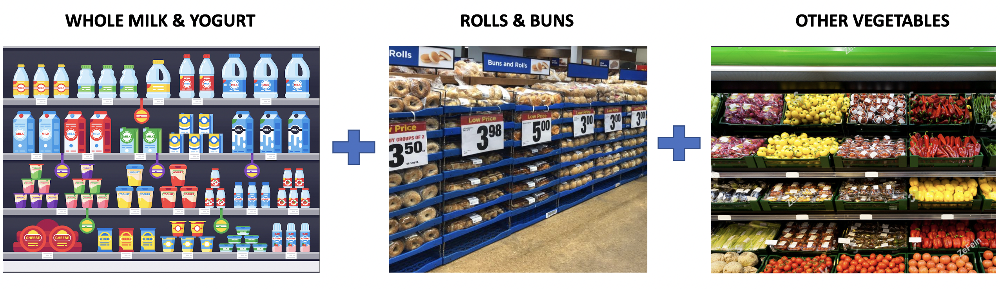*

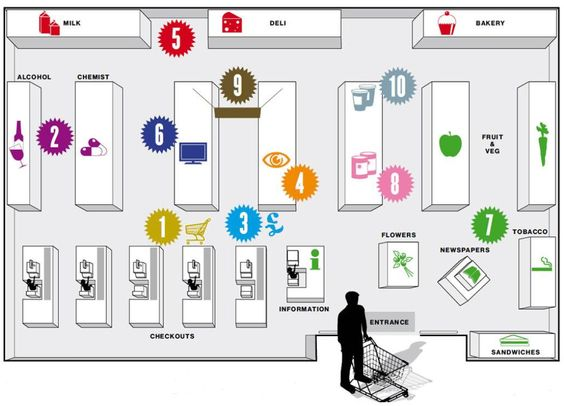

*Retailers can effectively trigger shoppers to buy at every point of purchase in-store if placement strategy is based on Market Basket Association Rule* 